# Table of Contents
- [Major Classes and File Parsing](#Major-Classes-and-File-Parsing)
- [Load the Data](#Load-the-Data)
- [Signal Exploration](#Signal-Exploration)
- [SVM Experiment Infrastructure](#SVM-Experiment-Infrastructure)
- [The SVM](#The-SVM)


In [50]:
# This cell includes the major classes used in our classification analyses
import matplotlib.pyplot as plt # needed for plotting
import numpy as np # numpy is primary library for numeric array (and matrix) handling
import scipy as sp
from scipy import stats, signal
import random
from sklearn import svm # needed for svm
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import pandas as pd
import time
# Each accelerometer log file gets parsed and made into a SensorData object
class SensorData:
    
    # Constructors in Python look like this (strangely enough)
    # All arguments are numpy arrays except sensorType, which is a str
    def __init__(self, sensorType, currentTimeMs, sensorTimestampMs, x, y, z):
        self.sensorType = sensorType
        
        # On my mac, I could cast as straight-up int but on Windows, this failed
        # This is because on Windows, a long is 32 bit but on Unix, a long is 64bit
        # So, forcing to int64 to be safe. See: https://stackoverflow.com/q/38314118
        self.currentTimeMs = currentTimeMs.astype(np.int64)
        
        # sensorTimestampMs comes from the Arduino function 
        # https://www.arduino.cc/reference/en/language/functions/time/millis/
        # which returns the number of milliseconds passed since the Arduino board began running the current program.
        self.sensorTimestampMs = sensorTimestampMs.astype(np.int64)
        
        self.x = x.astype(float)
        self.y = y.astype(float)
        self.z = z.astype(float)
   
        # Calculate the magnitude of the signal
        self.mag = np.sqrt(self.x**2 + self.y**2 + self.z**2)
        
        self.sampleLengthInSecs = (self.currentTimeMs[-1] - self.currentTimeMs[0]) / 1000.0
        self.samplesPerSecond = len(self.currentTimeMs) / self.sampleLengthInSecs 
        
    # Returns a dict of numpy arrays for each axis of the accel + magnitude
    def get_data(self):
        return {"x":self.x, "y":self.y, "z":self.z, "mag":self.mag}
    
    # Returns a dict of numpy arrays for each axis of the accel + magnitude
    def get_processed_data(self):
        return {"x_p":self.x_p, "y_p":self.y_p, "z_p":self.z_p, "mag_p":self.mag_p}

# A trial is one gesture recording and includes an accel SensorData object
# In the future, this could be expanded to include other recorded sensors (e.g., a gyro)
# that may be recorded simultaneously
class Trial:
    
    # We actually parse the sensor log files in the constructor--this is probably bad practice
    # But offers a relatively clean solution
    def __init__(self, gestureName, endTimeMs, trialNum, accelLogFilenameWithPath):
        self.gestureName = gestureName
        self.trialNum = trialNum
        self.endTimeMs = endTimeMs
        self.accelLogFilenameWithPath = accelLogFilenameWithPath
        self.accelLogFilename = os.path.basename(accelLogFilenameWithPath)
        
        # unpack=True puts each column in its own array, see https://stackoverflow.com/a/20245874
        # I had to force all types to strings because auto-type inferencing failed
        parsedAccelLogData = np.genfromtxt(accelLogFilenameWithPath, delimiter=',', 
                              dtype=str, encoding=None, skip_header=1, unpack=True)
        
        # The asterisk is really cool in Python. It allows us to "unpack" this variable
        # into arguments needed for the SensorData constructor. Google for "tuple unpacking"
        self.accel = SensorData("Accelerometer", *parsedAccelLogData)
    
    # Utility function that returns the end time as a nice string
    def getEndTimeMsAsString(self):
        return time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(self.endTimeMs / 1000))
    
    def setProcessedAccel(self, x, y, z, mag):
        self.processed_accel = SensorData(self.accel.sensorType, self.accel.currentTimeMs, 
                                          self.accel.sensorTimestampMs, x, y, z, mag)
    
    def __str__(self):
         return "'{}' : Trial {} from {}".format(self.gestureName, self.trialNum, self.accelLogFilename)

# Container for a single set of gestures and trials
class GestureSet:
    
    def __init__(self, gesture_log_path, map_gestures_to_trials):
        self.path = gesture_log_path
        self.map_gestures_to_trials = map_gestures_to_trials 

    # returns the longest trial (based on num rows recorded and not clock time)
    def get_longest_trial(self):
        longest_trial_length = -1
        longest_trial = None
        for gesture_name, trial_list in self.map_gestures_to_trials.items():
            for trial in trial_list:
                if longest_trial_length < len(trial.accel.x):
                    longest_trial_length = len(trial.accel.x)
                    longest_trial = trial
        return longest_trial
    
    # returns the base path
    def get_base_path(self):
        return os.path.basename(os.path.normpath(self.path))
    
    # returns the number of gestures
    def get_num_gestures(self):
        return len(self.map_gestures_to_trials)
    
    # returns trials for a gesture name
    def get_trials_for_gesture(self, gesture_name):
        return self.map_gestures_to_trials[gesture_name]
    
    # creates an aggregate signal based on *all* trials for this gesture
    # TODO: in future could add in an argument, which takes a list of trial nums
    # to use to produce aggregate signal
    def create_aggregate_signal(self, gesture_name, signal_var_name):
        trials = self.get_trials_for_gesture(gesture_name)
        aggregate_signal = None
        trial_signals = []
        trial_signals_original = []
        first_trial = None
        first_trial_signal = None
        
        max_length = -1
        for trial in trials:
            trial_signal = getattr(trial.accel, signal_var_name)
            if max_length < len(trial_signal):
                max_length = len(trial_signal)
            
        for i in range(len(trials)):
            if i == 0:
                first_trial = trials[i]
                trial_signal = getattr(first_trial.accel, signal_var_name)
                trial_signal_mod = np.copy(trial_signal)

                trial_signals_original.append(trial_signal)
                
                array_length_diff = max_length - len(trial_signal_mod)
                trial_signal_mod = np.pad(trial_signal_mod, (0, array_length_diff), 'edge')  
                
                trial_signals.append(np.copy(trial_signal_mod))
                
                aggregate_signal = trial_signal_mod
                first_trial_signal = trial_signal_mod
            else:

                cur_trial = trials[i]
                cur_trial_signal = getattr(cur_trial.accel, signal_var_name) 
                trial_signals_original.append(cur_trial_signal)
                
                array_length_diff = max_length - len(cur_trial_signal)
                cur_trial_signal_mod = np.pad(cur_trial_signal, (0, array_length_diff), 'edge')

                cur_trial_signal_mod = get_aligned_signal_cutoff_and_pad(cur_trial_signal_mod, first_trial_signal)
                trial_signals.append(cur_trial_signal_mod)
                aggregate_signal += cur_trial_signal_mod
        
        mean_signal = aggregate_signal / len(trial_signals) 
        
        return mean_signal, trial_signals

    # Returns the minimum number of trials across all gestures (just in case we accidentally recorded a 
    # different number. We should have the same number of trials across all gestures)
    def get_min_num_of_trials(self):
        minNumTrials = -1 
        for gestureName, trialSet in self.map_gestures_to_trials.items():
            if minNumTrials == -1 or minNumTrials > len(trialSet):
                minNumTrials = len(trialSet)
        return minNumTrials

    # returns the total number of trials
    def get_total_num_of_trials(self):
        numTrials = 0 
        for gestureName, trialSet in self.map_gestures_to_trials.items():
            numTrials = numTrials + len(trialSet)
        return numTrials
    
    # get random gesture name
    def get_random_gesture_name(self):
        gesture_names = list(self.map_gestures_to_trials.keys())
        rand_gesture_name = gesture_names[random.randint(0, len(gesture_names) - 1)]
        return rand_gesture_name
    
    # get random trial
    def get_random_trial(self):
        rand_gesture_name = self.get_random_gesture_name()
        print("rand_gesture_name", rand_gesture_name)
        trials_for_gesture = self.map_gestures_to_trials[rand_gesture_name]
        return trials_for_gesture[random.randint(0, len(trials_for_gesture) - 1)]
    
    # returns a sorted list of gesture names
    def get_gesture_names_sorted(self):
        return sorted(self.map_gestures_to_trials.keys())
    
    # prettify the str()
    def __str__(self):
         return "'{}' : {} gestures and {} total trials".format(self.path, self.get_num_gestures(), self.get_total_num_of_trials())
        

In [51]:
# This cell contains our file handling and parsing related functions
from os import listdir
import ntpath
import os

# Returns all csv filenames in the given directory
# Currently excludes any filenames with 'fulldatastream' in the title
def find_csv_filenames( path_to_dir, suffix=".csv" ):
    filenames = listdir(path_to_dir)
    return [ filename for filename in filenames if filename.endswith( suffix ) and "fulldatastream" not in filename ]

# Parses and creates Trial objects for all csv files in the given dir
# Returns a dict() mapping (str: gestureName) to (list: Trial objects)
def parse_and_create_gesture_trials( path_to_dir ):
    csvFilenames = find_csv_filenames(path_to_dir)
    
    print("Found {} csv files in {}".format(len(csvFilenames), path_to_dir))
    
    mapGestureNameToTrialList = dict()
    mapGestureNameToMapEndTimeMsToMapSensorToFile = dict()
    for csvFilename in csvFilenames:
        
        # parse filename into meaningful parts
        # print(csvFilename)
        filenameNoExt = os.path.splitext(csvFilename)[0];
        
        filenameParts = filenameNoExt.split("_")
        gestureName = None
        timeMs = None
        numRows = None
        sensorName = "Accelerometer" # currently only one sensor but could expand to more
            
        # Added this conditional on May 15, 2019 because Windows machines created differently formatted
        # filenames from Macs. Windows machines automatically replaced the character "'"
        # with "_", which affects filenames like "Midair Zorro 'Z'_1556730840228_206.csv"
        # which come out like "Midair Zorro _Z__1557937136974_211.csv" instead
        if '__' in filenameNoExt:
            filename_parts1 = filenameNoExt.split("__")
            gestureName = filename_parts1[0]
            gestureName = gestureName.replace('_',"'")
            gestureName += "'"
            
            filename_parts2 = filename_parts1[1].split("_")
            timeMs = filename_parts2[0]
            numRows = filename_parts2[1]
        else:
            filenameParts = filenameNoExt.split("_")
            gestureName = filenameParts[0]
            timeMs = filenameParts[1]
            numRows = int(filenameParts[2])
        
        # print("gestureName={} timeMs={} numRows={}".format(gestureName, timeMs, numRows))
        
        if gestureName not in mapGestureNameToMapEndTimeMsToMapSensorToFile:
            mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName] = dict()
        
        if timeMs not in mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName]:
            mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName][timeMs] = dict()
        
        mapGestureNameToMapEndTimeMsToMapSensorToFile[gestureName][timeMs][sensorName] = csvFilename
        # print (mapGestureNameToMapEndTimeMsToMapSensorToFile)
    
    print("Found {} gestures".format(len(mapGestureNameToMapEndTimeMsToMapSensorToFile)))
    
    # track the longest array so we can resize accordingly (by padding with zeros currently)
    maxArrayLength = -1
    trialWithMostSensorEvents = None
    
    # Now we need to loop through the data and sort each gesture set by timems values 
    # (so that we have trial 1, 2, 3, etc. in order)
    for gestureName, mapEndTimeMsToMapSensorToFile in mapGestureNameToMapEndTimeMsToMapSensorToFile.items():
        gestureTrialNum = 0
        mapGestureNameToTrialList[gestureName] = list()
        for endTimeMs in sorted(mapEndTimeMsToMapSensorToFile.keys()):
            mapSensorToFile = mapEndTimeMsToMapSensorToFile[endTimeMs]
            
            accelFilenameWithPath = os.path.join(path_to_dir, mapSensorToFile["Accelerometer"])
            gestureTrial = Trial(gestureName, endTimeMs, gestureTrialNum, accelFilenameWithPath)
            mapGestureNameToTrialList[gestureName].append(gestureTrial)
            
            if maxArrayLength < len(gestureTrial.accel.x):
                maxArrayLength = len(gestureTrial.accel.x)
                trialWithMostSensorEvents = gestureTrial
            
            gestureTrialNum = gestureTrialNum + 1
        
        print("Found {} trials for '{}'".format(len(mapGestureNameToTrialList[gestureName]), gestureName))
    
    # Perform some preprocessing
    listSamplesPerSec = list()
    listTotalSampleTime = list()
    print("Max trial length across all gesture is '{}' Trial {} with {} sensor events. Padding all arrays to match".
          format(trialWithMostSensorEvents.gestureName, trialWithMostSensorEvents.trialNum, maxArrayLength))
    
    for gestureName, trialList in mapGestureNameToTrialList.items():
        for trial in trialList: 

            listSamplesPerSec.append(trial.accel.samplesPerSecond)
            listTotalSampleTime.append(trial.accel.sampleLengthInSecs)
            
            # preprocess signal before classification and store in new arrays
            trial.accel.x_p = preprocess(trial.accel.x, maxArrayLength)
            trial.accel.y_p = preprocess(trial.accel.y, maxArrayLength)
            trial.accel.z_p = preprocess(trial.accel.z, maxArrayLength)
            trial.accel.mag_p = preprocess(trial.accel.mag, maxArrayLength)
            
            
    print("Avg samples/sec across {} sensor files: {:0.1f}".format(len(listSamplesPerSec), sum(listSamplesPerSec)/len(listSamplesPerSec)))
    print("Avg sample length across {} sensor files: {:0.1f}s".format(len(listTotalSampleTime), sum(listTotalSampleTime)/len(listTotalSampleTime)))
    print()
    return mapGestureNameToTrialList

# Performs some basic preprocesing on rawSignal and returns the preprocessed signal in a new array
def preprocess(rawSignal, maxArrayLength):
    meanFilterWindowSize = 10
    arrayLengthDiff = maxArrayLength - len(rawSignal)

    # CSE599 TODO: add in your own preprocessing here
    # Just smoothing the signal for now with a mean filter
    smoothed = np.convolve(rawSignal, np.ones((meanFilterWindowSize,))/meanFilterWindowSize, mode='valid')
    return sp.signal.detrend(smoothed)

# Returns the leafs in a path
# From: https://stackoverflow.com/a/8384788
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail or ntpath.basename(head)

# From: https://stackoverflow.com/questions/800197/how-to-get-all-of-the-immediate-subdirectories-in-python
def get_immediate_subdirectories(a_dir):
    return [name for name in os.listdir(a_dir)
            if os.path.isdir(os.path.join(a_dir, name))]

# Utility function to extract gesture name from filename
def extract_gesture_name( filename ):
    # leaf = path_leaf(filename)
    tokenSplitPos = filename.index('_')
    gestureName = filename[:tokenSplitPos]
    return gestureName

# Returns the minimum number of trials across all gestures (just in case we accidentally recorded a 
# different number. We should have 5 or 10 each for the A2 assignment)
def get_min_num_of_trials( mapGestureToTrials ):
    minNumTrials = -1 
    for gestureName, trialSet in mapGestureToTrials.items():
        if minNumTrials == -1 or minNumTrials > len(trialSet):
            minNumTrials = len(trialSet)
    return minNumTrials

# returns the total number of trials
def get_total_num_of_trials (mapGestureToTrials):
    numTrials = 0 
    for gestureName, trialSet in mapGestureToTrials.items():
        numTrials = numTrials + len(trialSet)
    return numTrials

# Helper function to align signals. 
# Returns a shifted signal of a based on cross correlation and a roll function
def get_aligned_signal(a, b):
    corr = signal.correlate(a, b, mode='full')
    index_shift = len(a) - np.argmax(corr)
    a_shifted = np.roll(a, index_shift - 1) 
    return a_shifted

# Returns a shifted signal of a based on cross correlation and padding
def get_aligned_signal_cutoff_and_pad(a, b):
    corr = signal.correlate(a, b, mode='full')
    index_shift = len(a) - np.argmax(corr)
    index_shift_abs = abs(index_shift - 1)
    a_shifted_cutoff = None
    if (index_shift - 1) < 0:
        a_shifted_cutoff = a[index_shift_abs:]
        a_shifted_cutoff = np.pad(a_shifted_cutoff, (0, index_shift_abs), 'edge')
    else:
        a_shifted_cutoff = np.pad(a, (index_shift_abs,), 'edge')
        a_shifted_cutoff = a_shifted_cutoff[:len(a)]
    return a_shifted_cutoff

def smooth(x,window_len=25,window='flat'):
    #Original code is from
    #https://scipy-cookbook.readthedocs.io/items/SignalSmooth.html
    #
    
    if x.ndim != 1:
        raise (ValueError, "smooth only accepts 1 dimension arrays.")

    if x.size < window_len:
        raise (ValueError, "Input vector needs to be bigger than window size.")


    if window_len<3:
        return x

    if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
        raise (ValueError, "Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")

    s=np.r_[x[window_len-1:0:-1],x,x[-2:-window_len-1:-1]]
    
    if window == 'flat': #moving average
        w=np.ones(window_len,'d')
    else:
        w=eval('np.'+window+'(window_len)')

    y=np.convolve(w/w.sum(),s,mode='valid')
    return y

#align_fft
def align_fft(a, b):
    #This method is modified from 
    #https://stackoverflow.com/questions/4688715/find-time-shift-between-two-similar-waveforms
    #
    
    min_len = np.min([len(a), len(b)])
    
    af = sp.fft(a[:min_len])
    bf = sp.fft(b[:min_len])
    c = sp.ifft(af * sp.conj(bf))

    time_shift = np.argmax(abs(c))
    
    if time_shift < min_len/2:
        return True, time_shift
    else:
        return False, min_len - time_shift
    
# calculate zero crossings
# See: https://stackoverflow.com/questions/3843017/efficiently-detect-sign-changes-in-python
# TODO: in future, could have a min_width detection threshold that ignores 
# any changes < min_width samples after an initial zero crossing was detected
# TODO: could also have a mininum height after the zero crossing (withing some window)
# to eliminate noise
def calc_zero_crossings(s):
    # I could not get the speedier solutions to work reliably so here's a 
    # custom non-Pythony solution
    cur_pt = s[0]
    zero_crossings = []
    for ind in range(1, len(s)):
        next_pt = s[ind]
        
        if ((next_pt < 0 and cur_pt > 0) or (next_pt > 0 and cur_pt < 0)):
            zero_crossings.append(ind)
        elif cur_pt == 0 and next_pt > 0:
            # check for previous points less than 0
            # as soon as tmp_pt is not zero, we are done
            tmp_pt = cur_pt
            walk_back_idx = ind
            while(tmp_pt == 0 and walk_back_idx > 0):
                walk_back_idx -= 1
                tmp_pt = s[walk_back_idx]
            
            if tmp_pt < 0:
                zero_crossings.append(ind)
        elif cur_pt == 0 and next_pt < 0:
            # check for previous points greater than 0
            # as soon as tmp_pt is not zero, we are done
            tmp_pt = cur_pt
            walk_back_idx = ind
            while(tmp_pt == 0 and walk_back_idx > 0):
                walk_back_idx -= 1
                tmp_pt = s[walk_back_idx]
            
            if tmp_pt > 0:
                zero_crossings.append(ind)
            
        cur_pt = s[ind]
    return zero_crossings

def get_max_freq_coef(s):
    n = len(s)
    sampling_rate = 77
    fft = np.fft.fft(s)
    freqs = np.fft.fftfreq(n)
    freqs = freqs * sampling_rate
    freqs = freqs[range(n//2)] # one side freq range
    fft = np.abs(fft)[range(n//2)] # one side freq range
    fft = fft / n
    idx = np.argmax(np.abs(fft))
    
    #print(freqs[idx], fft[idx])
    return freqs[idx], fft[idx]


## Load the Data

In [52]:
# Load the data
root_gesture_log_path = './GestureLogs' # this dir should have a set of gesture sub-directories
print(get_immediate_subdirectories(root_gesture_log_path))
gesture_log_paths = get_immediate_subdirectories(root_gesture_log_path)
map_gesture_sets = dict()
selected_gesture_set = None
for gesture_log_path in gesture_log_paths:
    if gesture_log_path == '.ipynb_checkpoints':
        continue
    
    path_to_gesture_log = os.path.join(root_gesture_log_path, gesture_log_path)
    print("Reading in:", path_to_gesture_log)
    map_gestures_to_trials = parse_and_create_gesture_trials(path_to_gesture_log)
    gesture_set = GestureSet(gesture_log_path, map_gestures_to_trials)
    map_gesture_sets[gesture_set.get_base_path()] = gesture_set
    if "Easy" in gesture_log_path:
        selected_gesture_set = gesture_set
        
if selected_gesture_set is not None:
    print("The selected gesture set:", selected_gesture_set)

def get_gesture_set_with_str(str):
    for base_path, gesture_set in map_gesture_sets.items():
        if str in base_path:
            return gesture_set
    return None

['JonGestureLogsHard', 'CJGestureLogs', 'JonGestureLogsEasy', '.ipynb_checkpoints']
Reading in: ./GestureLogs/JonGestureLogsHard
Found 55 csv files in ./GestureLogs/JonGestureLogsHard
Found 11 gestures
Found 5 trials for 'Midair 'S''
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Midair Clockwise 'O''
Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Bunny Hops'
Found 5 trials for 'Midair Counter-clockwise 'O''
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Shake'
Found 5 trials for 'At Rest'
Max trial length across all gesture is 'Baseball Throw' Trial 4 with 1100 sensor events. Padding all arrays to match
Avg samples/sec across 55 sensor files: 76.7
Avg sample length across 55 sensor files: 6.2s

Reading in: ./GestureLogs/CJGestureLogs
Found 55 csv files in ./GestureLogs/CJGestureLogs
Found 11 gestures
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Midair 'S''
Found 5 tria

## Signal Exploration

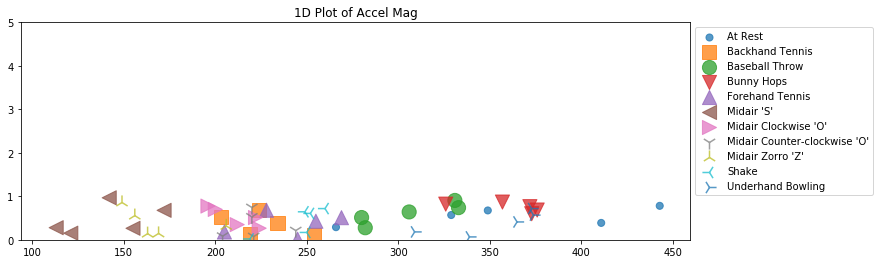

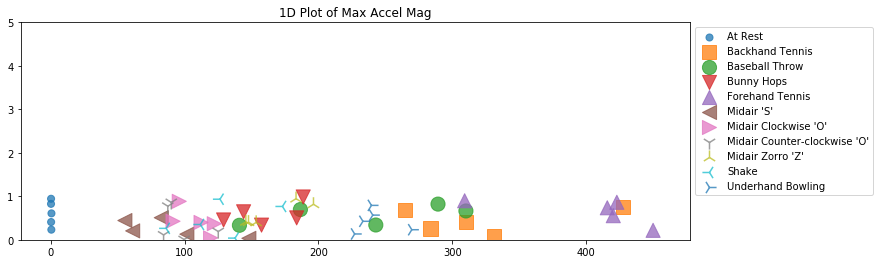

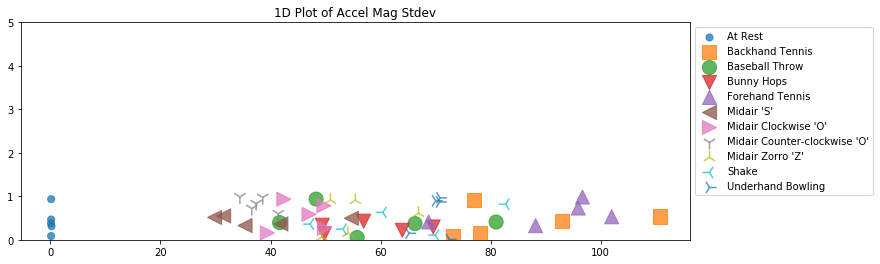

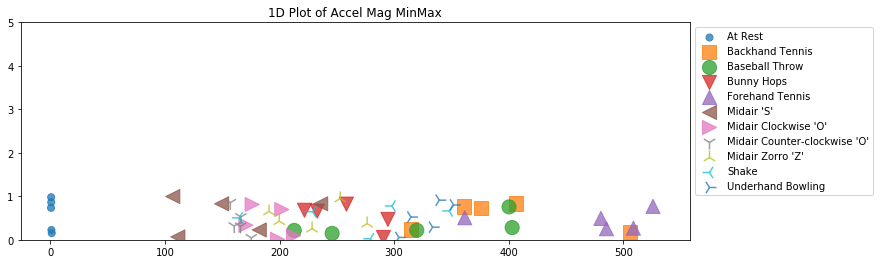

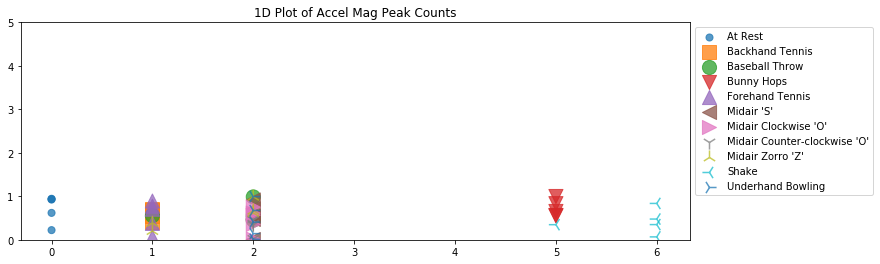

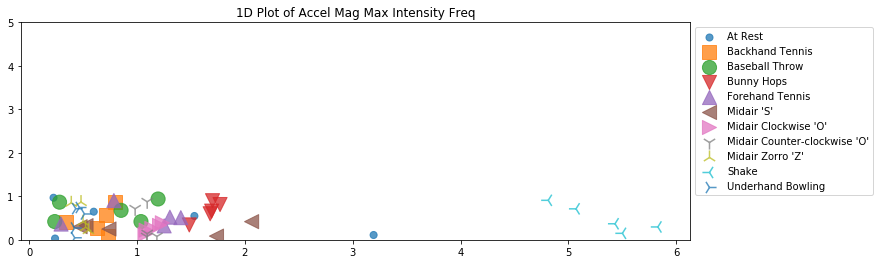

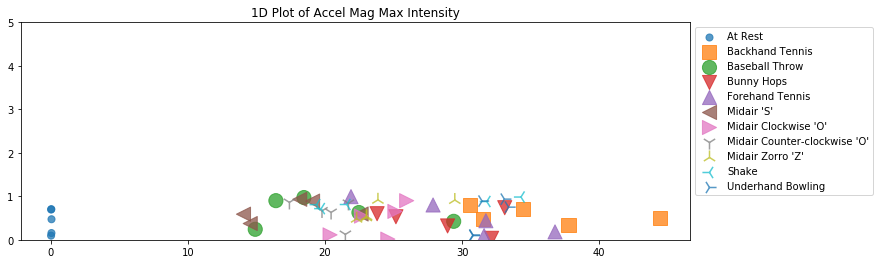

In [53]:
# first, let's graph some features along one dimension
# Brainstorm features
# - Length of signal
# - Max accel magnitude
# - Fundamental frequency
# - Top frequency
# - Intensity of top frequency
# - Top 5 frequency intensities (just plot which bins)
# - Average of values in the signal
# - Std deviation 
# - Count of points above some threshold
# - Counting the number of peaks (above a threshold)
# - Zero crossings 
# - Distance between zero crossings
# - Area under the curve
# - Max frequency of signal
# - Diff between max and mins
# - ... other things... read some papers, brainstorm, visualize!
import itertools

mapMarkerToDesc = {
    ".":"point",
    ",":"pixel",
    "o":"circle",
    "v":"triangle_down",
    "^":"triangle_up",
    "<":"triangle_left",
    ">":"triangle_right",
    "1":"tri_down",
    "2":"tri_up",
    "3":"tri_left",
    "4":"tri_right",
    "8":"octagon",
    "s":"square",
    "p":"pentagon",
    "*":"star",
    "h":"hexagon1",
    "H":"hexagon2",
    "+":"plus",
    "D":"diamond",
    "d":"thin_diamond",
    "|":"vline",
    "_":"hline"
}

# Plots the length of each trial's acceleration signal
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(len(trial.accel.mag) for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    # s is the marker size
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Accel Mag")
plt.show()

# Plots the maximum magnitude of each trial's processed acceleration signal
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(trial.accel.mag_p.max() for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Max Accel Mag")
plt.show()

# std deviation
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(np.std(trial.accel.mag_p) for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Accel Mag Stdev")
plt.show()

# min-max diff
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(np.max(trial.accel.mag_p)-np.min(trial.accel.mag_p) for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Accel Mag MinMax")
plt.show()

# number of peaks
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(len(sp.signal.find_peaks(trial.accel.mag_p, height=30, distance=77 / 3.0)[0]) for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Accel Mag Peak Counts")
plt.show()


# max intensity freq
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(get_max_freq_coef(trial.accel.mag_p)[0] for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Accel Mag Max Intensity Freq")
plt.show()

# intensity at the freq
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(get_max_freq_coef(trial.accel.mag_p)[1] for trial in trials)
    y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.ylim((0,5))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("1D Plot of Accel Mag Max Intensity")
plt.show()

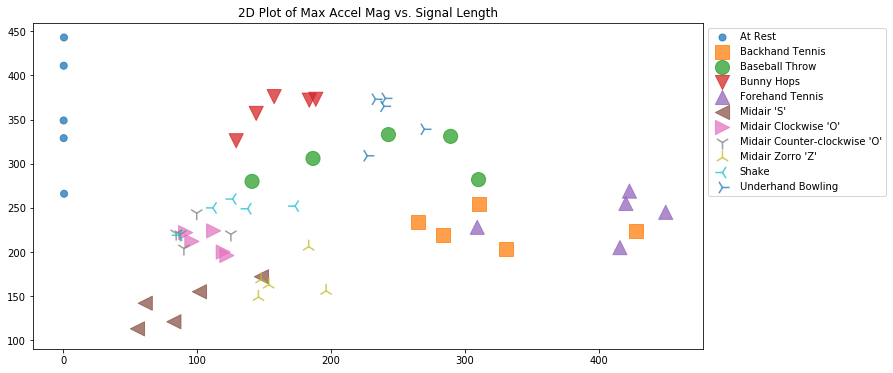

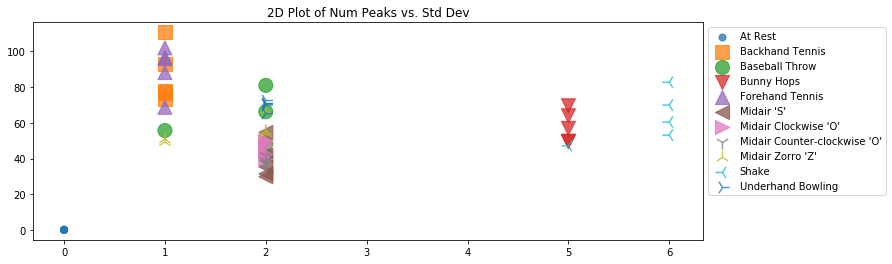

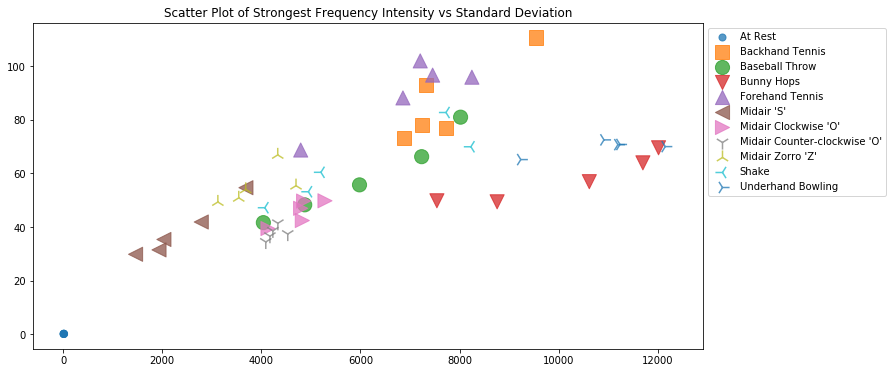

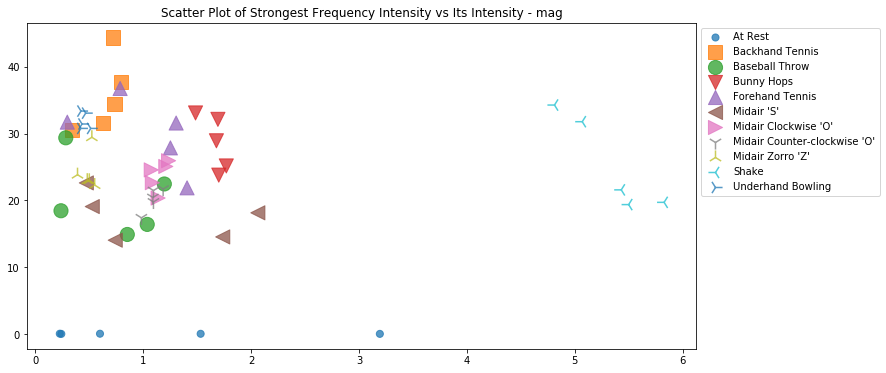

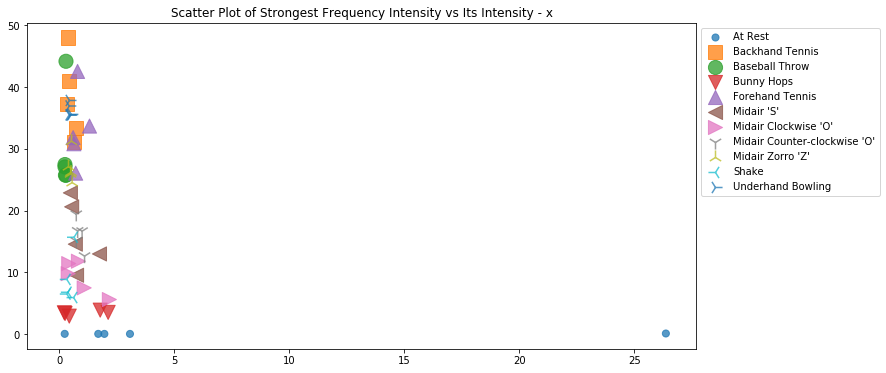

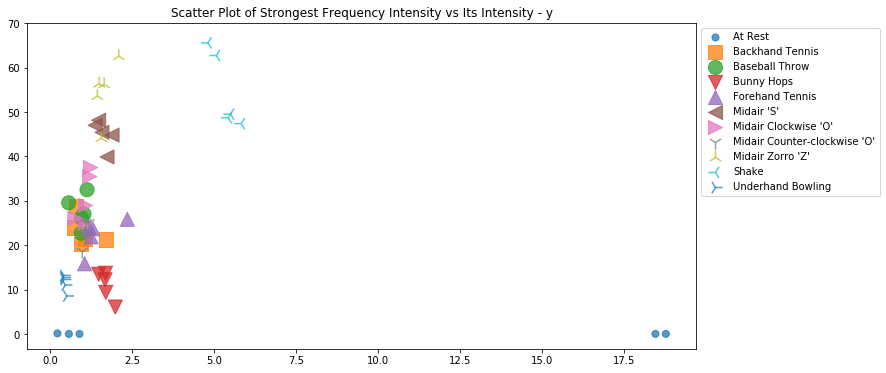

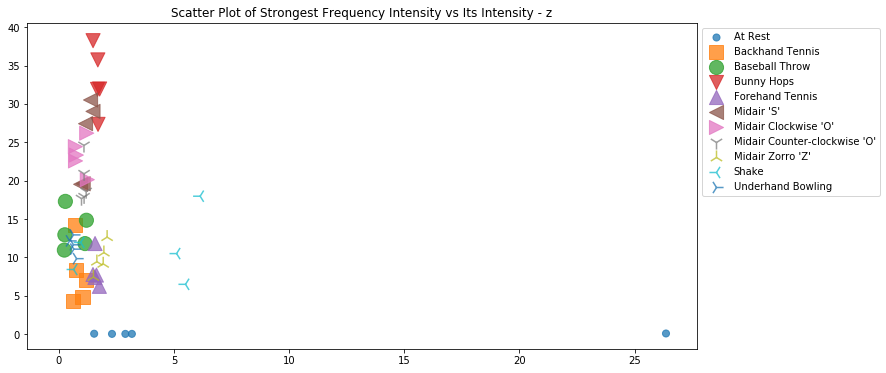

In [54]:
# Now, let's explore the discriminability of 2 dimensions. We should begin to see
# some clusters and visual groupings based on gesture type--that's good!
# And rememember that the SVM is going to be in far more than 2 dimensions... but
# it's harder to visualize anything > 2, so this just gives us some intuition about separation
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(trial.accel.mag_p.max() for trial in trials)
    y = list(len(trial.accel.mag) for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("2D Plot of Max Accel Mag vs. Signal Length")
plt.show()

# num peaks vs. std dev
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 4))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = []
    for trial in trials:
        s = trial.accel.mag_p
        min_distance_between_peaks = 77 / 3.0
        peak_indices, peak_properties = sp.signal.find_peaks(s, height=30, distance=min_distance_between_peaks)
        x.append(len(peak_indices))  
        
    y = list(np.std(trial.accel.mag_p) for trial in trials)
    #print(gesture_name, x, y)
    # y = np.random.rand(len(x))
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)

plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("2D Plot of Num Peaks vs. Std Dev")
plt.show()

# strongest freq intensity vs. std dev
markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(np.abs(np.fft.fft(trial.accel.mag_p)).max() for trial in trials)
    y = list(np.std(trial.accel.mag_p) for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)
    
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("Scatter Plot of Strongest Frequency Intensity vs Standard Deviation")
plt.show()


markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(get_max_freq_coef(trial.accel.mag_p)[0] for trial in trials)
    y = list(get_max_freq_coef(trial.accel.mag_p)[1] for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)
    
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("Scatter Plot of Strongest Frequency Intensity vs Its Intensity - mag")
plt.show()

markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(get_max_freq_coef(trial.accel.x_p)[0] for trial in trials)
    y = list(get_max_freq_coef(trial.accel.x_p)[1] for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)
    
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("Scatter Plot of Strongest Frequency Intensity vs Its Intensity - x")
plt.show()

markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(get_max_freq_coef(trial.accel.y_p)[0] for trial in trials)
    y = list(get_max_freq_coef(trial.accel.y_p)[1] for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)
    
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("Scatter Plot of Strongest Frequency Intensity vs Its Intensity - y")
plt.show()

markers = list(mapMarkerToDesc.keys())
marker = itertools.cycle(markers)
plt.figure(figsize=(12, 6))
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
    x = list(get_max_freq_coef(trial.accel.z_p)[0] for trial in trials)
    y = list(get_max_freq_coef(trial.accel.z_p)[1] for trial in trials)
    s = [200] * len(x)
    plt.scatter(x, y, alpha=0.75, marker=next(marker), s=s, label=gesture_name)
    
plt.legend(loc='upper left', bbox_to_anchor=(1,1))    
plt.title("Scatter Plot of Strongest Frequency Intensity vs Its Intensity - z")
plt.show()

max freq=0.00 with coef=41.75 for 'At Rest'
max freq=0.63 with coef=8292.02 for 'Backhand Tennis'
max freq=0.24 with coef=6019.69 for 'Baseball Throw'
max freq=1.68 with coef=9950.29 for 'Bunny Hops'
max freq=0.59 with coef=6790.11 for 'Forehand Tennis'
max freq=0.47 with coef=2733.59 for 'Midair 'S''
max freq=1.07 with coef=4990.35 for 'Midair Clockwise 'O''
max freq=0.98 with coef=3935.89 for 'Midair Counter-clockwise 'O''
max freq=0.39 with coef=4076.96 for 'Midair Zorro 'Z''
max freq=5.22 with coef=4486.54 for 'Shake'
max freq=0.42 with coef=10470.86 for 'Underhand Bowling'


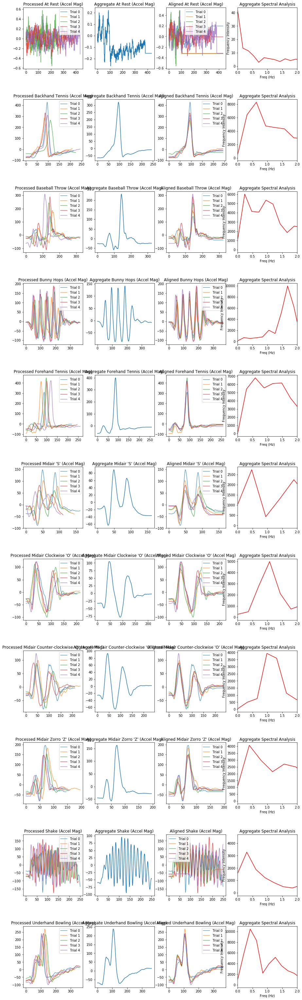

In [55]:
# Let's plot the processed mag signal, an aggregate signal, and the spectral analysis 
# of that signal. Because our sampling rate is ~77Hz (see trial.samplesPerSecond), the
# highest frequency we can detect is 77/2 (38.5Hz) due to the NyQuist frequency but this
# should be fine for human gesture motion
#
# I'm plotting the aggregate signal to see if there are *overall* trends in the data
# that we can take advantage of
map_gestures_to_trials = selected_gesture_set.map_gestures_to_trials
fig, axes = plt.subplots(len(map_gestures_to_trials), 4, figsize=(15, 5 * len(map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
gestureNamesSorted = sorted(map_gestures_to_trials.keys())
for gestureName in gestureNamesSorted:
    gestureTrials = map_gestures_to_trials[gestureName]
    trialNum = 0
    for trial in gestureTrials:
        axes[index][0].plot(trial.accel.mag_p, alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][0].set_title("Processed " + gestureName + " (Accel Mag)")
    axes[index][0].legend()
    
    aggregate, aligned_trials = selected_gesture_set.create_aggregate_signal(gestureName, "mag_p")
    axes[index][1].plot(aggregate, label="Aggregate")
    axes[index][1].set_title("Aggregate " + gestureName + " (Accel Mag)")
    
    trialNum = 0
    for i in range(0, len(aligned_trials)):
        axes[index][2].plot(aligned_trials[i], alpha=0.7, label="Trial {}".format(trialNum))
        trialNum = trialNum + 1
        
    axes[index][2].set_title("Aligned " + gestureName + " (Accel Mag)")
    axes[index][2].legend()
    
    # analyze this aggregate signal
    s = aggregate
    sampling_rate = 77
    n = len(s)
    fft = np.fft.fft(s)
    freqs = np.fft.fftfreq(n)
    freqs = freqs * sampling_rate # convert normalized freq bins to our freq bins

    freqs = freqs[range(n//2)] # one side freq range
    fft = np.abs(fft)[range(n//2)] # one side freq range
    #fft = fft / n # normalize to values 0 - 1
    axes[index][3].plot(freqs, fft, 'r')
    axes[index][3].set_title('Aggregate Spectral Analysis')
    axes[index][3].set_xlabel('Freq (Hz)')
    axes[index][3].set_ylabel('Frequency Intensity')
    axes[index][3].set_xlim(0,2)

    # find the max frequency
    # you could modify this to find the top ~3-5 max frequencies
    idx = np.argmax(np.abs(fft))
    max_freq = freqs[idx]
    print("max freq={:0.2f} with coef={:0.2f} for '{}'".format(max_freq, fft[idx],gestureName))

    index = index + 1

## SVM Experiment Infrastructure

In [56]:
# This cell contains some helper methods like my kfold generation function
# and confusion matrix plotting

from sklearn import svm # needed for svm
from sklearn.metrics import confusion_matrix
import itertools

# Returns a list of folds where each list item is a dict() with key=gesture name and value=selected trial 
# for that fold. To generate the same fold structure, pass in the same seed value (this is useful for
# setting up experiments)
def generate_kfolds(numFolds, map_gestures_to_trials, seed=None):
    
    # Quick check to make sure that there are numFolds of gesture trials for each gesture
    for gestureName, trials in map_gestures_to_trials.items():
        if numFolds != len(trials):
            raise ValueError("For the purposes of this assignment, the number of folds={} must equal the number of trials for each gesture. Gesture '{}' has {} trials"
                             .format(numFolds, gestureName, len(trials)))


    numGestures = len(map_gestures_to_trials)
    tmpMapGestureToTrials = dict()
    for gestureName, trials in map_gestures_to_trials.items():
        tmpMapGestureToTrials[gestureName] = list(trials)
    
    gestureNames = list(map_gestures_to_trials.keys())

    # create folds
    foldToMapGestureToTrial = list()
    random.seed(seed)
    for i in range(0, numFolds):
        curFoldMapGestureToTrial = dict()
        foldToMapGestureToTrial.append(curFoldMapGestureToTrial)
        
        for j in range(0, numGestures):
            curGestureName = gestureNames[j]
            trialList = tmpMapGestureToTrials[curGestureName]
            randTrialIndex = 0
            if (len(trialList) > 0):
                randTrialIndex = random.randint(0, len(trialList) - 1)

            randTrial = trialList[randTrialIndex]
            curFoldMapGestureToTrial[curGestureName] = randTrial
            del trialList[randTrialIndex]
    
    return foldToMapGestureToTrial

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

## The SVM

===========Hard==========

Training time 0.06


Inference time -0.00


Training time 0.05


Inference time -0.00


Training time 0.05


Inference time -0.00


Training time 0.05


Inference time -0.00


Training time 0.05


Inference time -0.00

SVM Results:

At Rest: 5/5 (100.0%)
Backhand Tennis: 5/5 (100.0%)
Baseball Throw: 5/5 (100.0%)
Bunny Hops: 4/5 (80.0%)
Forehand Tennis: 5/5 (100.0%)
Midair 'S': 3/5 (60.0%)
Midair Clockwise 'O': 4/5 (80.0%)
Midair Counter-clockwise 'O': 3/5 (60.0%)
Midair Zorro 'Z': 5/5 (100.0%)
Shake: 2/5 (40.0%)
Underhand Bowling: 4/5 (80.0%)

Total SVM classifier accuracy 81.82%


Total elapsed time 0.02



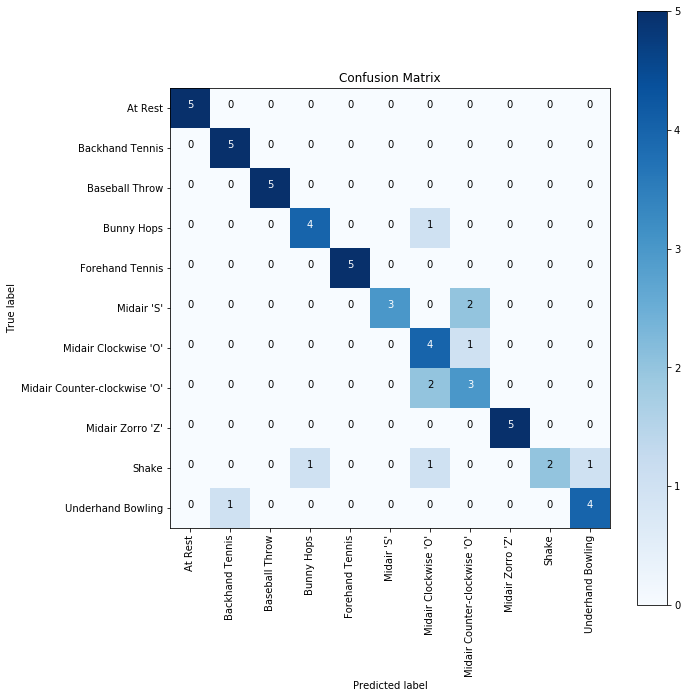

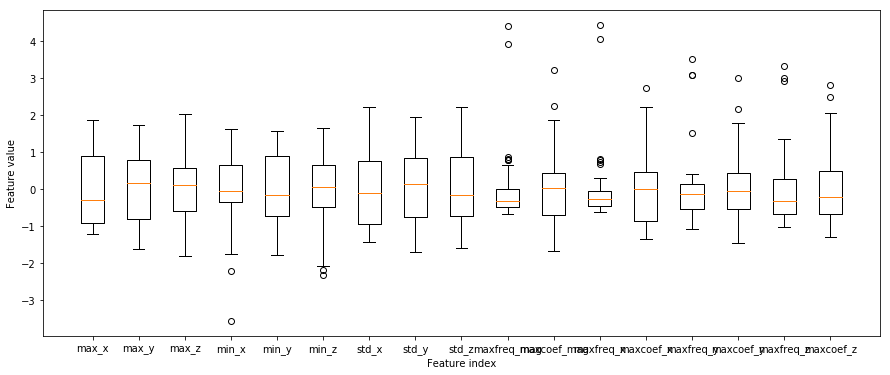

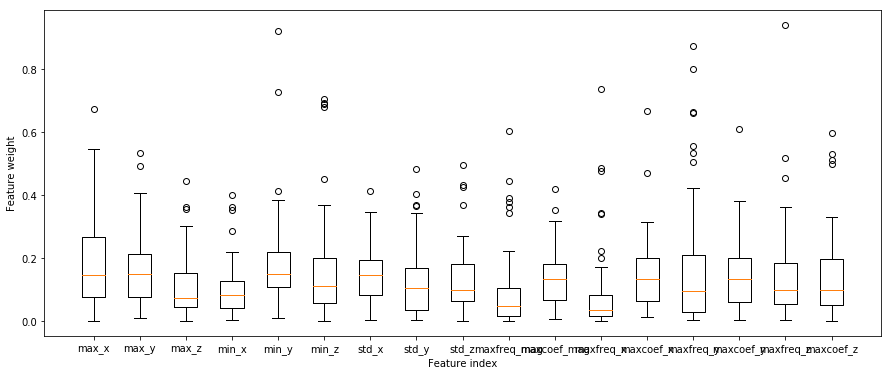

[('max_x', 0.18957989161717537), ('min_y', 0.18122991254824675), ('maxfreq_y', 0.17578797499379792), ('min_z', 0.16944796089166697), ('max_y', 0.1598900646075384), ('std_x', 0.15588763237838987), ('maxcoef_y', 0.1493013356920109), ('maxcoef_x', 0.1476802251372125), ('maxcoef_z', 0.14340397927839613), ('maxfreq_z', 0.14334313613113653), ('maxcoef_mag', 0.1405209206771023), ('std_z', 0.13394725447262873), ('std_y', 0.125761781636564), ('max_z', 0.11037873726978), ('min_x', 0.10355739238603125), ('maxfreq_mag', 0.09508651703880215), ('maxfreq_x', 0.08604777899510173)]
===========CJ==========

Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00

SVM Results:

At Rest: 5/5 (100.0%)
Backhand Tennis: 5/5 (100.0%)
Baseball Throw: 4/5 (80.0%)
Custom: 5/5 (100.0%)
Forehand Tennis: 4/5 (80.0%)
Midair 'S': 5/5 (100.0%)
Midair Clockwis

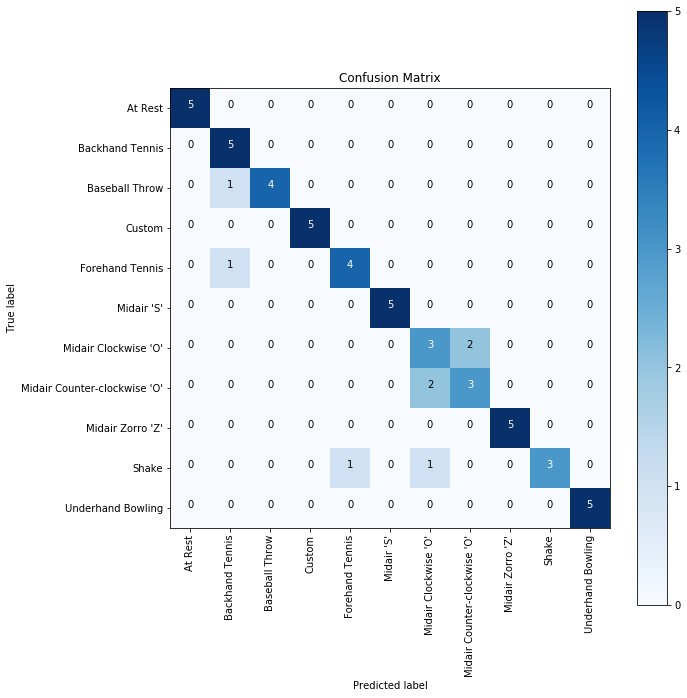

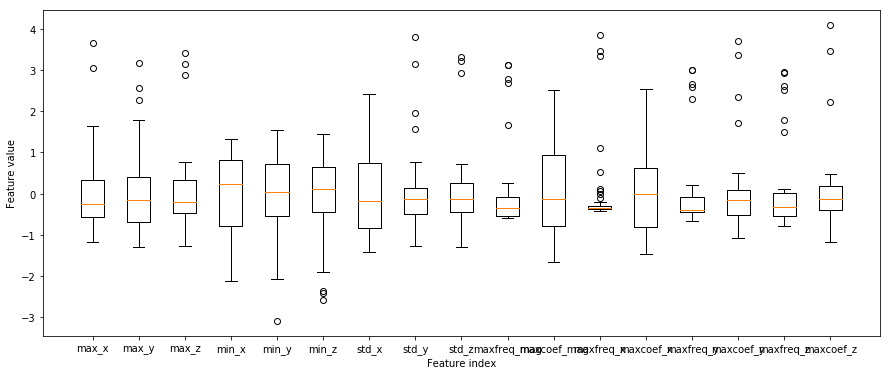

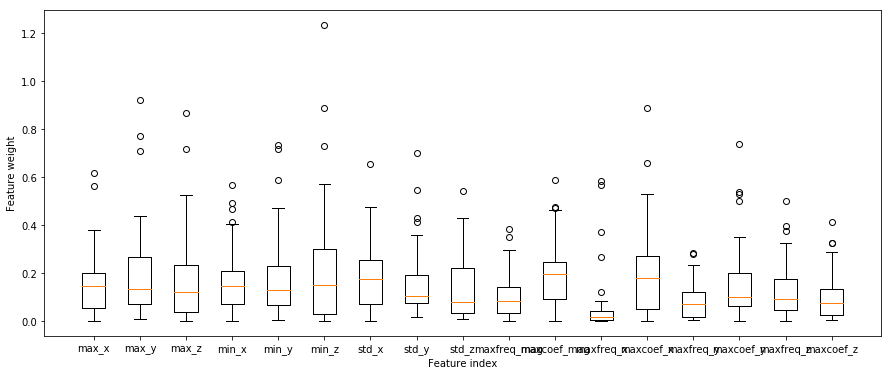

[('min_z', 0.2191712074199892), ('max_y', 0.2052094316116286), ('maxcoef_x', 0.2027865774064183), ('maxcoef_mag', 0.19208537468043627), ('std_x', 0.1821552556215408), ('min_y', 0.17332392530948112), ('max_z', 0.16657745948404107), ('min_x', 0.164373392794998), ('std_y', 0.16029258133314456), ('max_x', 0.15920659922123698), ('maxcoef_y', 0.1572197128036791), ('std_z', 0.13735465100359961), ('maxfreq_z', 0.12306018291605389), ('maxcoef_z', 0.0990238102649714), ('maxfreq_mag', 0.09813627003035229), ('maxfreq_y', 0.07914138250604873), ('maxfreq_x', 0.05531170563535304)]
===========Easy==========

Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00


Training time 0.04


Inference time -0.00

SVM Results:

At Rest: 5/5 (100.0%)
Backhand Tennis: 4/5 (80.0%)
Baseball Throw: 5/5 (100.0%)
Bunny Hops: 5/5 (100.0%)
Forehand Tennis: 5/5 (100.0%)
Midair 'S': 5/5 (100.0%)
Midair 

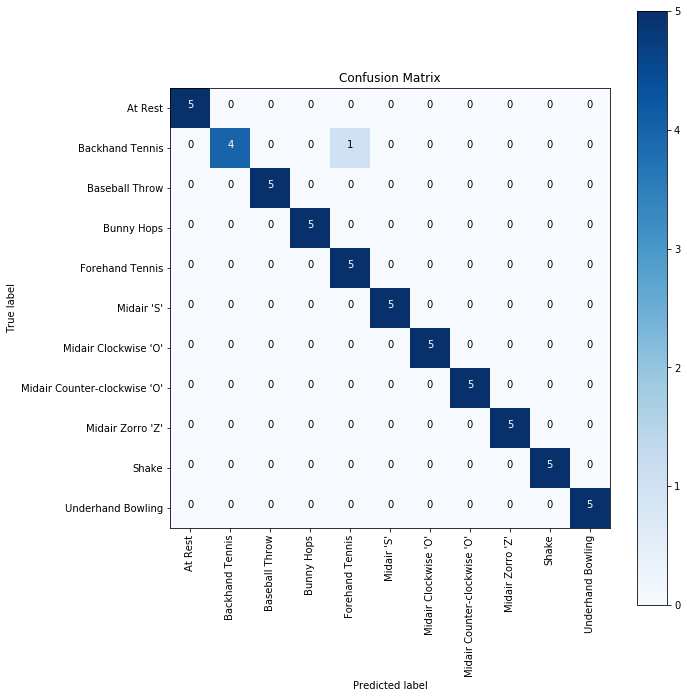

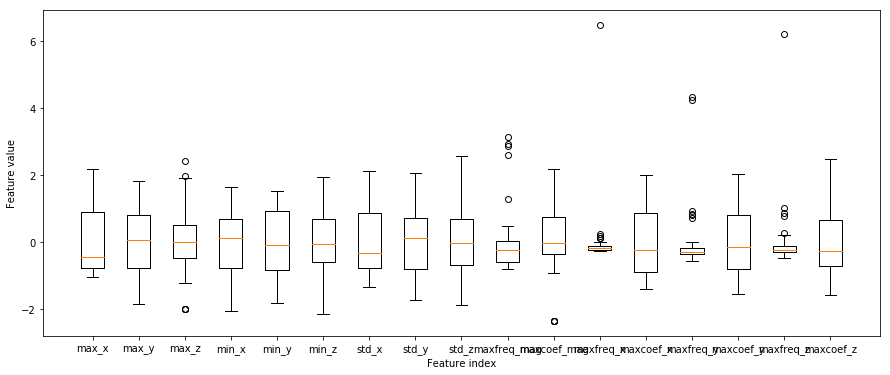

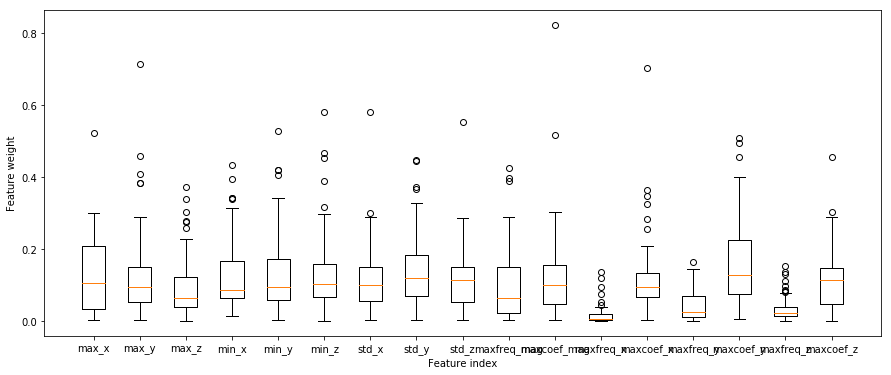

[('maxcoef_y', 0.16406016942448345), ('std_y', 0.1455502802312692), ('min_y', 0.13922484418702943), ('max_y', 0.1378816462345163), ('min_z', 0.13647601043006471), ('min_x', 0.13408125212216412), ('maxcoef_mag', 0.13079496257749842), ('max_x', 0.12272711751498544), ('maxcoef_z', 0.12236430167503312), ('maxcoef_x', 0.12235763169179074), ('std_z', 0.12159879818184009), ('std_x', 0.11495621736268141), ('maxfreq_mag', 0.10088811021664554), ('max_z', 0.09475912310124392), ('maxfreq_y', 0.04328725501169611), ('maxfreq_z', 0.03579580883853257), ('maxfreq_x', 0.018266559309671016)]


In [66]:
# This is the simplest possible SVM using only a few features but gives you a sense of the overall approach
# Some nice resources:
#  - A very simple classification example using scikit: 
#     https://dbaumgartel.wordpress.com/2014/03/10/a-scikit-learn-example-in-10-lines/
#  - A nice video overview of SVM: https://youtu.be/N1vOgolbjSc
#  - Official sci-kit learn: http://scikit-learn.org/stable/modules/svm.html

from sklearn import svm
import itertools
from sklearn.decomposition import PCA



# Returns a feature vectof for the given trial
def extract_features_example(trial):
    
    # Play around with features to extract and use in your model
    # Brainstorm features, visualize ideas, try them, and iterate
    # This is likely where you will spend most of your time :)
    # This is the "feature engineering" component of working in ML
    features = []
    names = []
    #features.append(trial.accel.mag_p.max())
    #names.append('minmax_mag')
    #features.append(trial.accel.x_p.max()-trial.accel.x_p.min())
    #names.append('minmax_x')
    #features.append(trial.accel.y_p.max()-trial.accel.y_p.min())
    #names.append('minmax_y')
    #features.append(trial.accel.z_p.max()-trial.accel.z_p.min())
    #names.append('minmax_z')
    features.append(trial.accel.x_p.max())
    names.append('max_x')
    features.append(trial.accel.y_p.max())
    names.append('max_y')
    features.append(trial.accel.z_p.max())
    names.append('max_z')
    #features.append(trial.accel.mag_p.min())
    features.append(trial.accel.x_p.min())
    names.append('min_x')
    features.append(trial.accel.y_p.min())
    names.append('min_y')
    features.append(trial.accel.z_p.min())
    names.append('min_z')
    #features.append(np.std(trial.accel.mag_p))
    features.append(np.std(trial.accel.x_p))
    names.append('std_x')
    features.append(np.std(trial.accel.y_p))
    names.append('std_y')
    features.append(np.std(trial.accel.z_p))
    names.append('std_z')
    #features.append(trial.accel.mag_p.mean())
    #features.append(trial.accel.x_p.mean())
    #names.append('mean_x')
    #features.append(trial.accel.y_p.mean())
    #names.append('mean_y')
    #features.append(trial.accel.z_p.mean())
    #names.append('mean_z')
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.mag_p)
    #features.append(len(peak_indices))
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.x_p)
    #features.append(len(peak_indices))
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.y_p)
    #features.append(len(peak_indices))
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.z_p)
    #features.append(len(peak_indices))
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.x, height=30, distance=77/3.0)
    #features.append(len(peak_indices))
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.y, height=30, distance=77/3.0)
    #features.append(len(peak_indices))
    #peak_indices, peak_properties = sp.signal.find_peaks(trial.accel.z, height=30, distance=77/3.0)
    #features.append(len(peak_indices))
    #features.append(sp.stats.entropy(smooth(trial.accel.mag)))
    #features.append(sp.stats.entropy(smooth(trial.accel.x)))
    #features.append(sp.stats.entropy(smooth(trial.accel.y)))
    #features.append(sp.stats.entropy(smooth(trial.accel.z)))
    
    max_freq, max_coef = get_max_freq_coef(trial.accel.mag_p)
    features.append(max_freq)
    names.append('maxfreq_mag')
    features.append(max_coef)
    names.append('maxcoef_mag')
    max_freq, max_coef = get_max_freq_coef(trial.accel.x_p)
    features.append(max_freq)
    names.append('maxfreq_x')
    features.append(max_coef)
    names.append('maxcoef_x')
    max_freq, max_coef = get_max_freq_coef(trial.accel.y_p)
    features.append(max_freq)
    names.append('maxfreq_y')
    features.append(max_coef)
    names.append('maxcoef_y')
    max_freq, max_coef = get_max_freq_coef(trial.accel.z_p)
    features.append(max_freq)
    names.append('maxfreq_z')
    features.append(max_coef)
    names.append('maxcoef_z')
    
    return features, names

for g_name in ['Hard', 'CJ', 'Easy']:
    print("=====================")
    print("===========%s=========="%g_name)
    print("=====================")
    numFolds = 5
    selected_gesture_set = get_gesture_set_with_str(g_name)
    numGestures = selected_gesture_set.get_num_gestures()
    numTrialsTotal = selected_gesture_set.get_total_num_of_trials()

    # Setting a seed here keeps producing the same folds set each time. Take that out
    # if you want to randomly produce a fold set on every execution
    foldToMapGestureToTrial = generate_kfolds(numFolds, selected_gesture_set.map_gestures_to_trials, seed=5)
    mapGestureToCorrectMatches = dict()

    y_true = []
    y_pred = []

    gestureNamesSorted = selected_gesture_set.get_gesture_names_sorted()
    for gestureName in gestureNamesSorted:
        mapGestureToCorrectMatches[gestureName] = 0

    for i in range(0, len(foldToMapGestureToTrial)):
        start = time.time()
        trainingFolds = foldToMapGestureToTrial.copy()
        testFold = trainingFolds.pop(i)

        trainingData = []
        classLabels = np.array([])

        # build training data for this set of folds
        for trainingFold in trainingFolds:
            for trainingGestureName, trainingTrial in trainingFold.items():
                features, feature_names = extract_features_example(trainingTrial)
                trainingData.append(features)
                classLabels = np.append(classLabels, trainingGestureName)

        #Scaler
        trainingData = np.array(trainingData)
        scaler = StandardScaler()
        scaler.fit(trainingData)
        training_data_scaled = scaler.transform(trainingData)

        #pca = PCA(n_components=10)
        #training_data_scaled = pca.fit_transform(training_data_scaled)


        # Here, we train SVM, the 'rbf' kernal is default
        # if you use rbf, need to set gamma and C parameters
        # play around with different kernels, read about them, and try them. What happens?
        # see: 
        # - https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html#sphx-glr-auto-examples-svm-plot-rbf-parameters-py
        # - https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
        clf = svm.SVC(kernel='linear') # kernel='rbf'
        #clf.fit(np.array(trainingData), classLabels) 
        clf.fit(training_data_scaled, classLabels)
        end = time.time()
        print("\nTraining time {:0.2f}\n".format(end - start))

        start = time.time()
        # make predictions for this test set
        for testGestureName, testTrial in testFold.items():
            features, feature_names = np.array(extract_features_example(testTrial))
            features_scaled = scaler.transform([features])
            #features_scaled = pca.transform(features_scaled)

            #svmPrediction = clf.predict([features])
            svmPrediction = clf.predict(features_scaled)
            y_true.append(testGestureName)
            y_pred.append(svmPrediction)

            if testGestureName == svmPrediction[0]:
                mapGestureToCorrectMatches[testGestureName] += 1
        print("\nInference time {:0.2f}\n".format(end - start))
                
    totalCorrectMatches = 0
    end = time.time()
    print("SVM Results:\n")
    for gesture in mapGestureToCorrectMatches:
        c = mapGestureToCorrectMatches[gesture]
        print("{}: {}/{} ({}%)".format(gesture, c, numFolds, c / numFolds * 100))
        totalCorrectMatches += mapGestureToCorrectMatches[gesture]

    print("\nTotal SVM classifier accuracy {:0.2f}%\n".format(totalCorrectMatches / numTrialsTotal * 100))
    print("\nTotal elapsed time {:0.2f}\n".format(end - start))

    cm = confusion_matrix(y_true, y_pred, gestureNamesSorted)
    plt.figure(figsize=(10,10))
    plot_confusion_matrix(cm, classes=gestureNamesSorted, title='Confusion Matrix')
    plt.show()

    plt.figure(figsize=(15,6))
    plt.boxplot(training_data_scaled, manage_xticks=False)
    plt.xlabel("Feature index")
    plt.ylabel("Feature value")
    plt.xticks(range(1, len(feature_names)+1), feature_names)
    plt.show()


    plt.figure(figsize=(15,6))
    plt.boxplot(abs(clf.coef_), manage_xticks=False)
    plt.xlabel("Feature index")
    plt.ylabel("Feature weight")
    plt.xticks(range(1, len(feature_names)+1), feature_names)
    plt.show()
    
    sorted_mean_coef = sorted(list(zip(feature_names, np.mean(abs(clf.coef_), axis=0))), key=lambda x: x[1], reverse=True)
    
    print(sorted_mean_coef)



/projects/support/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


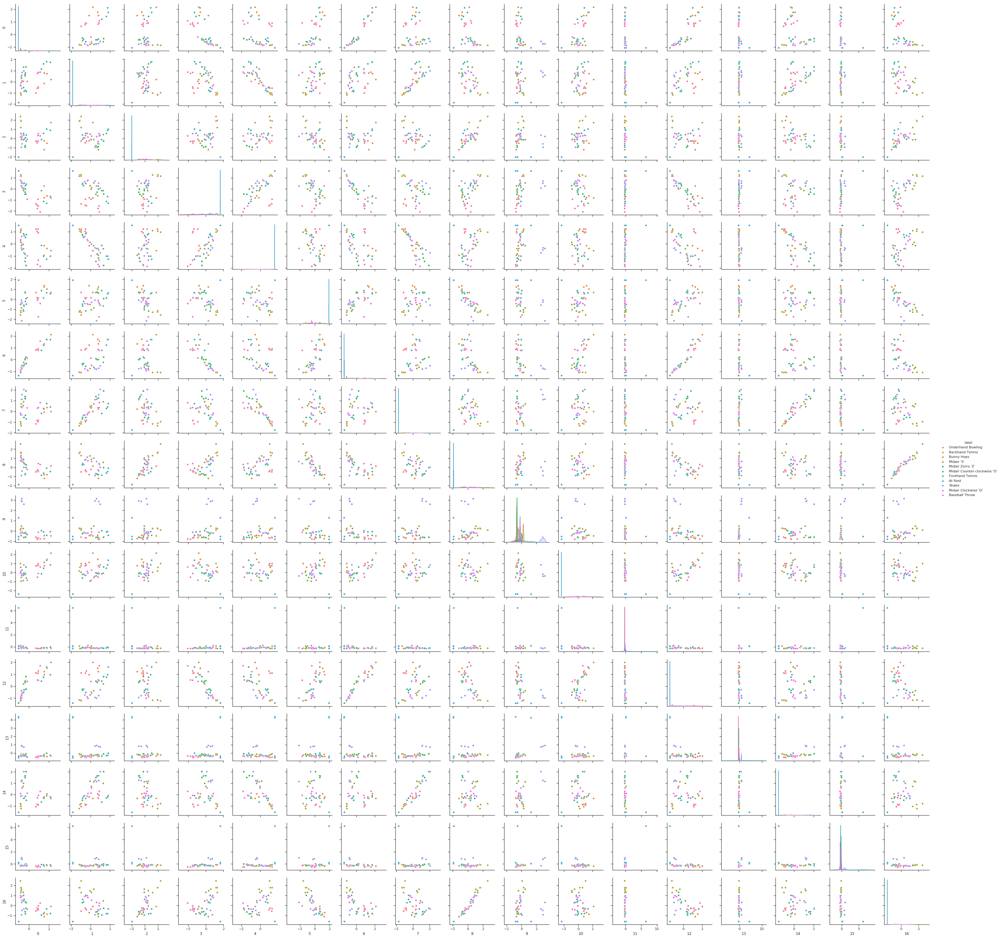

In [69]:
sns.set(style="ticks", color_codes=True)
df = pd.DataFrame(training_data_scaled)
df['label'] = classLabels
g = sns.pairplot(df, hue='label')

# Shape-based gesture recognition

In [58]:
from fastdtw import fastdtw
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

def aggregate_train_set(trials, test_idx):
    x = np.mean([v for i, v in enumerate(trials['x']) if i != test_idx], axis=0)
    y = np.mean([v for i, v in enumerate(trials['y']) if i != test_idx], axis=0)
    z = np.mean([v for i, v in enumerate(trials['z']) if i != test_idx], axis=0)
    mag = np.mean([v for i, v in enumerate(trials['mag']) if i != test_idx], axis=0)
    return {'x': x, 'y': y, 'z': z, 'mag': mag}

def aggregate_test_set(trials, test_idx):
    x = [v for i, v in enumerate(trials['x']) if i == test_idx][0]
    y = [v for i, v in enumerate(trials['y']) if i == test_idx][0]
    z = [v for i, v in enumerate(trials['z']) if i == test_idx][0]
    mag = [v for i, v in enumerate(trials['mag']) if i == test_idx][0]
    return {'x': x, 'y': y, 'z': z, 'mag': mag}

def split_gestures(selected_gesture_set, mapGestureToTrials, gestureNamesSorted):
    train = [{}]*5
    test = [{}]*5

    test_set_idx = [0,1,2,3,4]
    np.random.shuffle(test_set_idx)
    
    for gestureName in gestureNamesSorted:
        gestureTrials = mapGestureToTrials[gestureName]
        
        trials = {'x': selected_gesture_set.create_aggregate_signal(gestureName, 'x_p')[1], 
                   'y': selected_gesture_set.create_aggregate_signal(gestureName, 'y_p')[1], 
                   'z': selected_gesture_set.create_aggregate_signal(gestureName, 'z_p')[1],
                   'mag': selected_gesture_set.create_aggregate_signal(gestureName, 'mag_p')[1]}
        
        for i, t in enumerate(test_set_idx):
            train[i][gestureName] = aggregate_train_set(trials, t)
            test[i][gestureName] = aggregate_test_set(trials, t)
        
    return train, test

def visualize_train_test(train, test, mapGestureToTrials, gestureNamesSorted):
    fig, axes = plt.subplots(len(mapGestureToTrials), 4, figsize=(20, 3 * len(mapGestureToTrials)))
    fig.subplots_adjust(hspace=0.5)

    index=0

    for gestureName in gestureNamesSorted:
        axes[index][0].plot(train[gestureName]['x'], alpha=0.7, label="Train")
        axes[index][1].plot(train[gestureName]['y'], alpha=0.7, label="Train")
        axes[index][2].plot(train[gestureName]['z'], alpha=0.7, label="Train")
        axes[index][3].plot(train[gestureName]['mag'], alpha=0.7, label="Train")

        axes[index][0].plot(test[gestureName]['x'], alpha=0.7, label="Test")
        axes[index][1].plot(test[gestureName]['y'], alpha=0.7, label="Test")
        axes[index][2].plot(test[gestureName]['z'], alpha=0.7, label="Test")
        axes[index][3].plot(test[gestureName]['mag'], alpha=0.7, label="Test")

        axes[index][0].set_title(gestureName + " (Accel X)")
        axes[index][0].legend()

        axes[index][1].set_title(gestureName + " (Accel Y)")
        axes[index][1].legend()

        axes[index][2].set_title(gestureName + " (Accel Z)")
        axes[index][2].legend()

        axes[index][3].set_title(gestureName + " (Accel Mag)")
        axes[index][3].legend()
        index = index + 1
    
    plt.show()
        
def recognize_gesture(train, test, gestureNamesSorted):
    y_true = []
    y_pred = []
    for test_gesture, test_data in test.items():
        min_distance = 999999999
        min_distance_gesture = ''
        for train_gesture, train_data in train.items():
            dist_x, _ = fastdtw(test_data['x'], train_data['x'], dist=sp.spatial.distance.euclidean)
            dist_y, _ = fastdtw(test_data['y'], train_data['y'], dist=sp.spatial.distance.euclidean)
            dist_z, _ = fastdtw(test_data['z'], train_data['z'], dist=sp.spatial.distance.euclidean)
            dist_mag, _ = fastdtw(test_data['mag'], train_data['mag'], dist=sp.spatial.distance.euclidean)
            
            dist_sum = np.sum([dist_x, dist_y, dist_z, dist_mag])
            
            if min_distance > dist_sum:
                min_distance = dist_sum
                min_distance_gesture = train_gesture
            
        print(test_gesture, min_distance_gesture, min_distance)
        y_pred.append(min_distance_gesture)
        y_true.append(test_gesture)    
    
    return y_true, y_pred

===========Hard==========
k=0


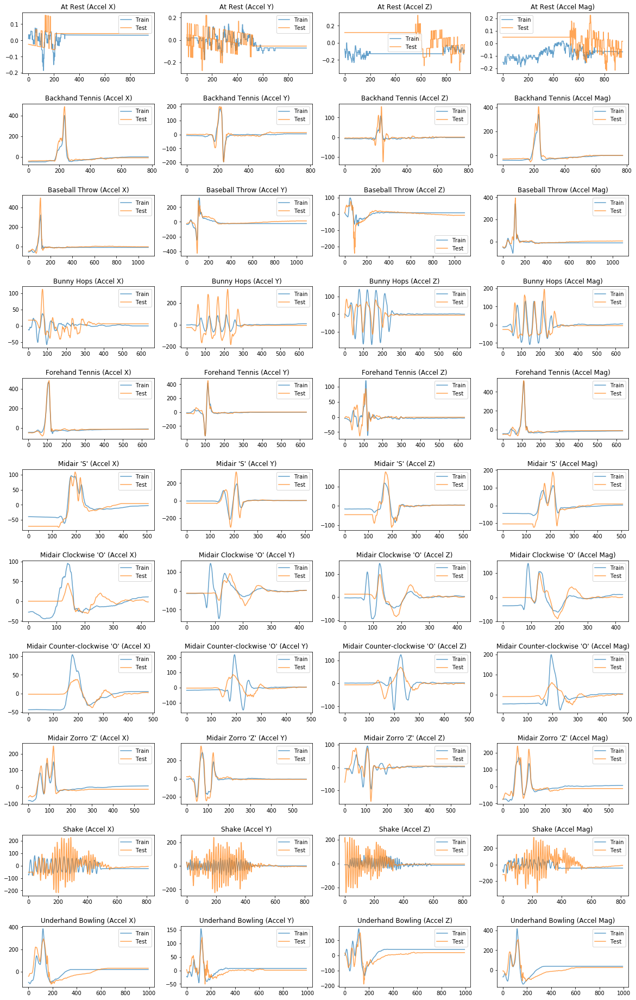

At Rest At Rest 320.27661781989036
Backhand Tennis Backhand Tennis 18118.210291703588
Baseball Throw Forehand Tennis 40147.773848628356
Bunny Hops Bunny Hops 40519.28461287069
Forehand Tennis Forehand Tennis 10177.072076512277
Midair 'S' Midair Zorro 'Z' 26949.019427441952
Midair Clockwise 'O' Midair Clockwise 'O' 24021.723700323975
Midair Counter-clockwise 'O' Midair Clockwise 'O' 21256.717474533772
Midair Zorro 'Z' Midair Zorro 'Z' 24176.56883659172
Shake Shake 122768.51625258662
Underhand Bowling Underhand Bowling 46371.930250891186
Total time elapsed: 356.86
k=1


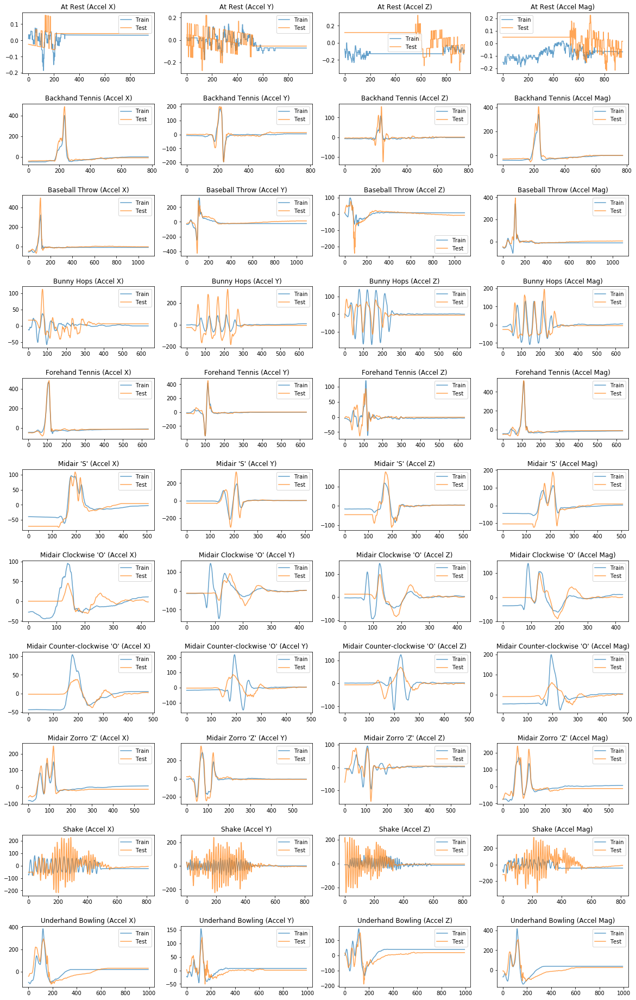

At Rest At Rest 320.27661781989036
Backhand Tennis Backhand Tennis 18118.210291703588
Baseball Throw Forehand Tennis 40147.773848628356
Bunny Hops Bunny Hops 40519.28461287069
Forehand Tennis Forehand Tennis 10177.072076512277
Midair 'S' Midair Zorro 'Z' 26949.019427441952
Midair Clockwise 'O' Midair Clockwise 'O' 24021.723700323975
Midair Counter-clockwise 'O' Midair Clockwise 'O' 21256.717474533772
Midair Zorro 'Z' Midair Zorro 'Z' 24176.56883659172
Shake Shake 122768.51625258662
Underhand Bowling Underhand Bowling 46371.930250891186
Total time elapsed: 360.22
k=2


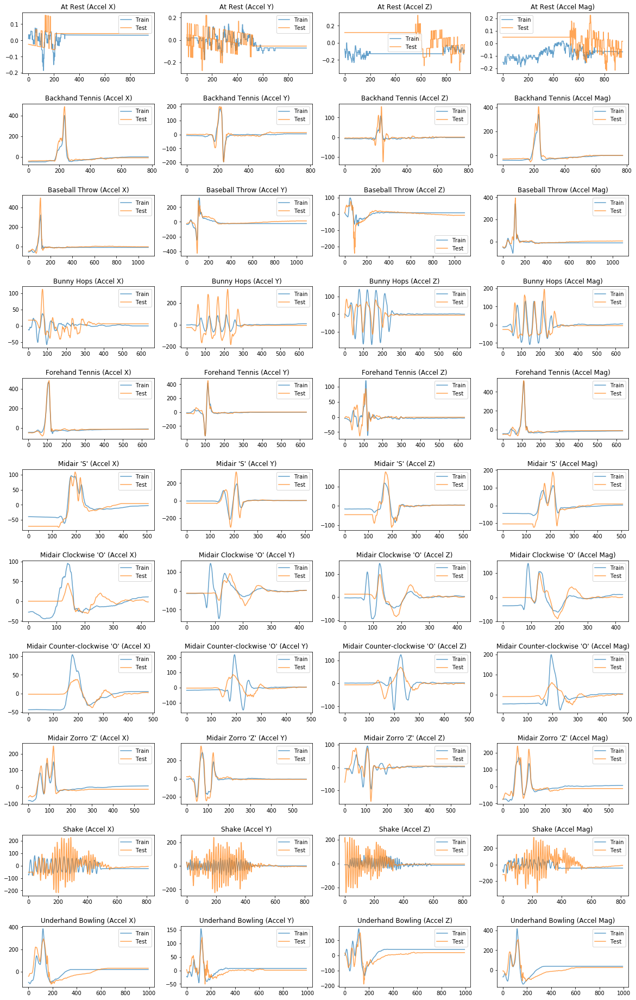

At Rest At Rest 320.27661781989036
Backhand Tennis Backhand Tennis 18118.210291703588
Baseball Throw Forehand Tennis 40147.773848628356
Bunny Hops Bunny Hops 40519.28461287069
Forehand Tennis Forehand Tennis 10177.072076512277
Midair 'S' Midair Zorro 'Z' 26949.019427441952
Midair Clockwise 'O' Midair Clockwise 'O' 24021.723700323975
Midair Counter-clockwise 'O' Midair Clockwise 'O' 21256.717474533772
Midair Zorro 'Z' Midair Zorro 'Z' 24176.56883659172
Shake Shake 122768.51625258662
Underhand Bowling Underhand Bowling 46371.930250891186
Total time elapsed: 361.14
k=3


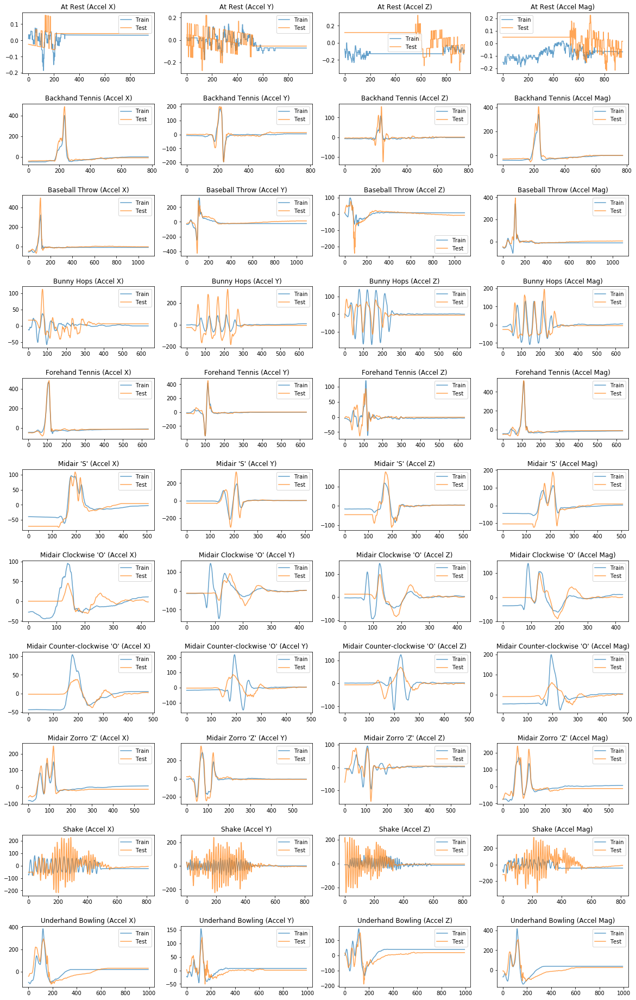

At Rest At Rest 320.27661781989036
Backhand Tennis Backhand Tennis 18118.210291703588
Baseball Throw Forehand Tennis 40147.773848628356
Bunny Hops Bunny Hops 40519.28461287069
Forehand Tennis Forehand Tennis 10177.072076512277
Midair 'S' Midair Zorro 'Z' 26949.019427441952
Midair Clockwise 'O' Midair Clockwise 'O' 24021.723700323975
Midair Counter-clockwise 'O' Midair Clockwise 'O' 21256.717474533772
Midair Zorro 'Z' Midair Zorro 'Z' 24176.56883659172
Shake Shake 122768.51625258662
Underhand Bowling Underhand Bowling 46371.930250891186
Total time elapsed: 360.64
k=4


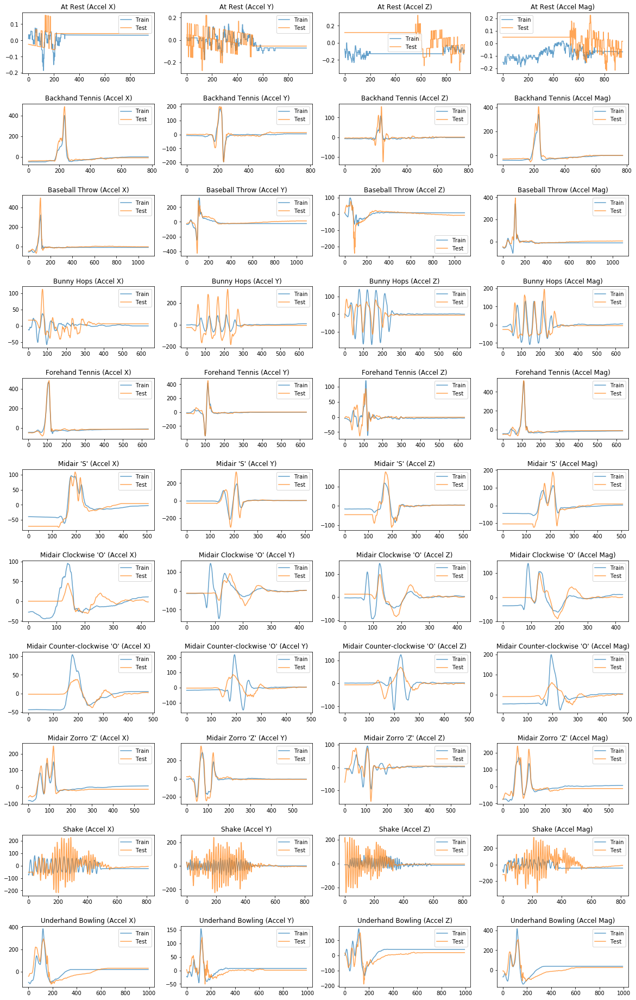

At Rest At Rest 320.27661781989036
Backhand Tennis Backhand Tennis 18118.210291703588
Baseball Throw Forehand Tennis 40147.773848628356
Bunny Hops Bunny Hops 40519.28461287069
Forehand Tennis Forehand Tennis 10177.072076512277
Midair 'S' Midair Zorro 'Z' 26949.019427441952
Midair Clockwise 'O' Midair Clockwise 'O' 24021.723700323975
Midair Counter-clockwise 'O' Midair Clockwise 'O' 21256.717474533772
Midair Zorro 'Z' Midair Zorro 'Z' 24176.56883659172
Shake Shake 122768.51625258662
Underhand Bowling Underhand Bowling 46371.930250891186
Total time elapsed: 362.00
                              precision    recall  f1-score   support

                     At Rest       1.00      1.00      1.00         5
             Backhand Tennis       1.00      1.00      1.00         5
              Baseball Throw       0.00      0.00      0.00         5
                  Bunny Hops       1.00      1.00      1.00         5
             Forehand Tennis       0.50      1.00      0.67         5
          

/projects/support/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/projects/support/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/projects/support/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


===========Easy==========
k=0


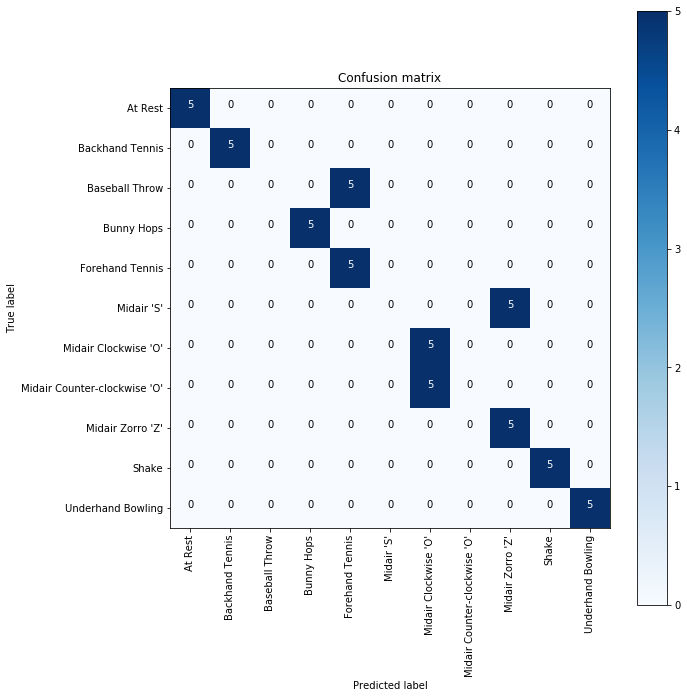

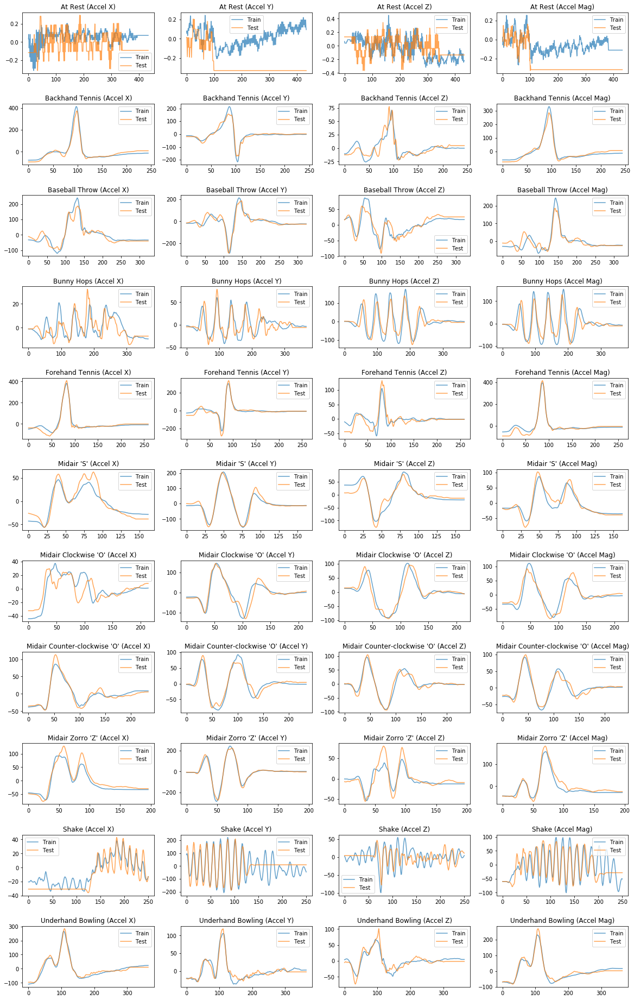

At Rest At Rest 272.2992909924125
Backhand Tennis Backhand Tennis 6312.367102843607
Baseball Throw Baseball Throw 9345.480721786556
Bunny Hops Bunny Hops 7424.219822671021
Forehand Tennis Forehand Tennis 7390.957547773302
Midair 'S' Midair 'S' 3960.2355198999685
Midair Clockwise 'O' Midair Clockwise 'O' 3108.7892931534225
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 2724.353475013136
Midair Zorro 'Z' Midair Zorro 'Z' 3925.497769239166
Shake Shake 18882.65722674499
Underhand Bowling Underhand Bowling 6235.33995576846
Total time elapsed: 141.34
k=1


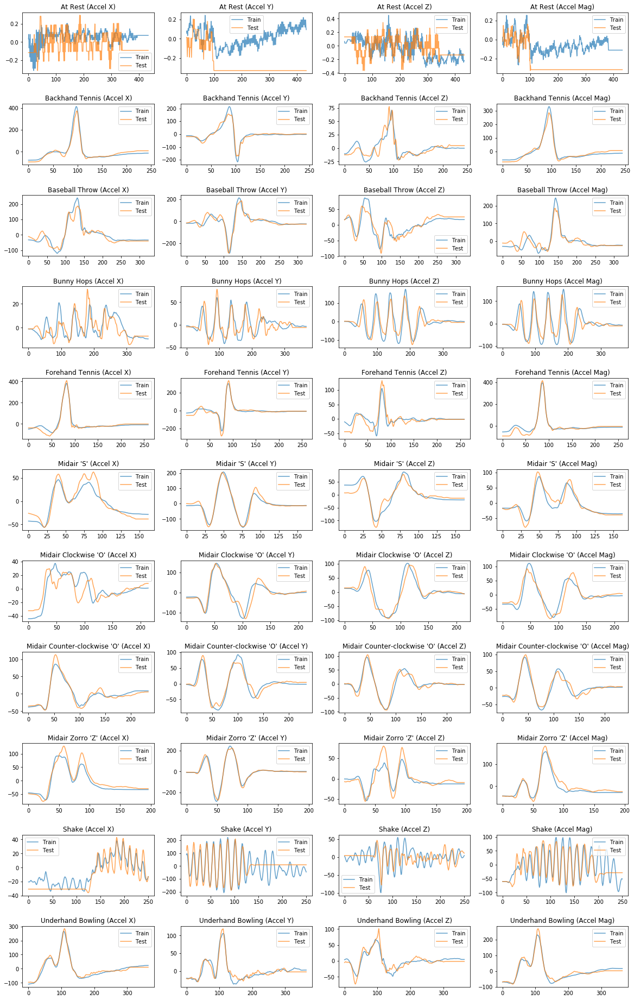

At Rest At Rest 272.2992909924125
Backhand Tennis Backhand Tennis 6312.367102843607
Baseball Throw Baseball Throw 9345.480721786556
Bunny Hops Bunny Hops 7424.219822671021
Forehand Tennis Forehand Tennis 7390.957547773302
Midair 'S' Midair 'S' 3960.2355198999685
Midair Clockwise 'O' Midair Clockwise 'O' 3108.7892931534225
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 2724.353475013136
Midair Zorro 'Z' Midair Zorro 'Z' 3925.497769239166
Shake Shake 18882.65722674499
Underhand Bowling Underhand Bowling 6235.33995576846
Total time elapsed: 140.23
k=2


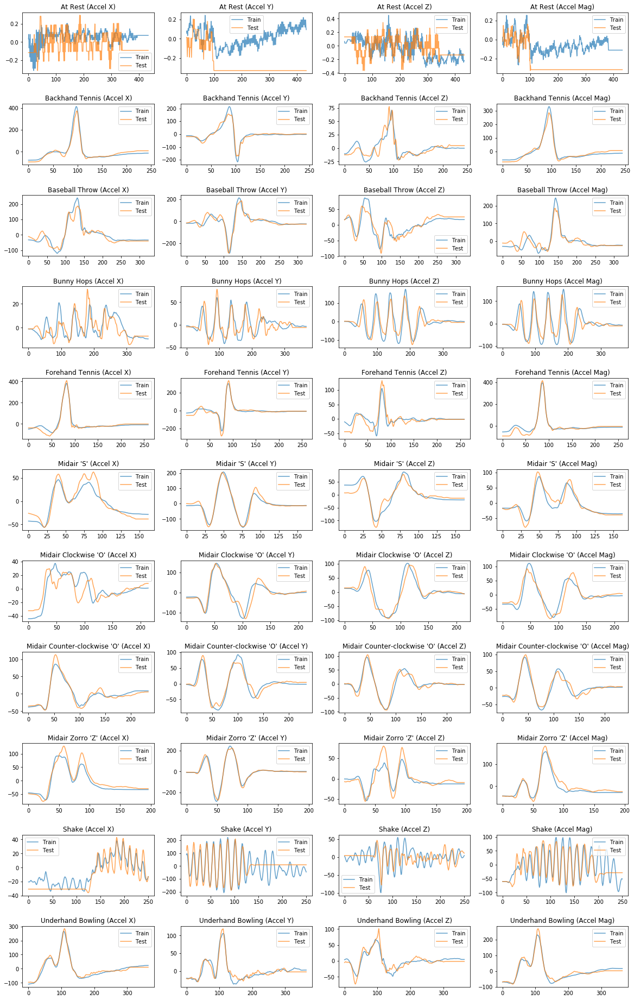

At Rest At Rest 272.2992909924125
Backhand Tennis Backhand Tennis 6312.367102843607
Baseball Throw Baseball Throw 9345.480721786556
Bunny Hops Bunny Hops 7424.219822671021
Forehand Tennis Forehand Tennis 7390.957547773302
Midair 'S' Midair 'S' 3960.2355198999685
Midair Clockwise 'O' Midair Clockwise 'O' 3108.7892931534225
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 2724.353475013136
Midair Zorro 'Z' Midair Zorro 'Z' 3925.497769239166
Shake Shake 18882.65722674499
Underhand Bowling Underhand Bowling 6235.33995576846
Total time elapsed: 139.50
k=3


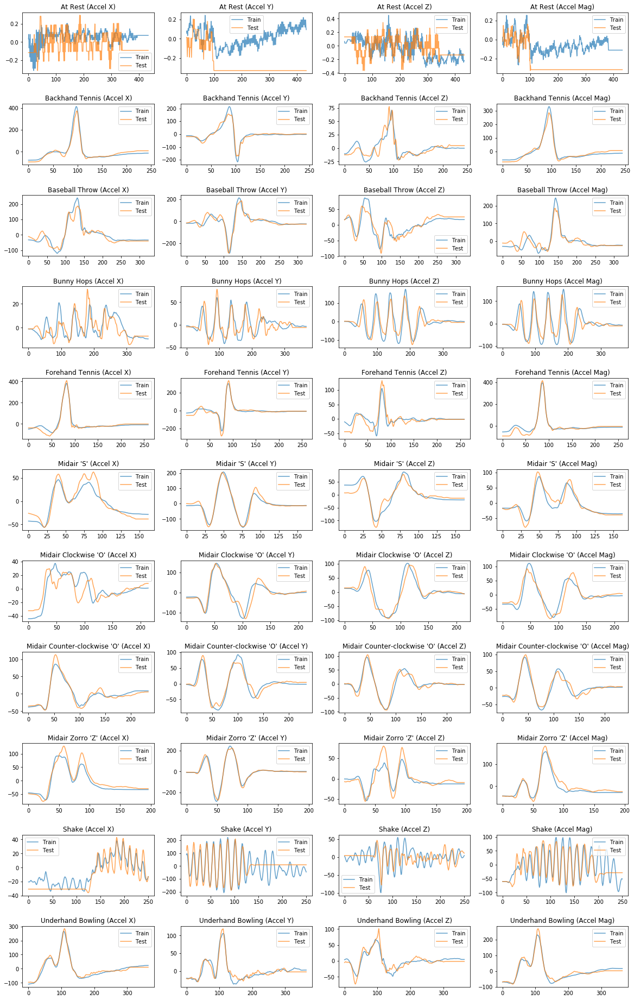

At Rest At Rest 272.2992909924125
Backhand Tennis Backhand Tennis 6312.367102843607
Baseball Throw Baseball Throw 9345.480721786556
Bunny Hops Bunny Hops 7424.219822671021
Forehand Tennis Forehand Tennis 7390.957547773302
Midair 'S' Midair 'S' 3960.2355198999685
Midair Clockwise 'O' Midair Clockwise 'O' 3108.7892931534225
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 2724.353475013136
Midair Zorro 'Z' Midair Zorro 'Z' 3925.497769239166
Shake Shake 18882.65722674499
Underhand Bowling Underhand Bowling 6235.33995576846
Total time elapsed: 140.56
k=4


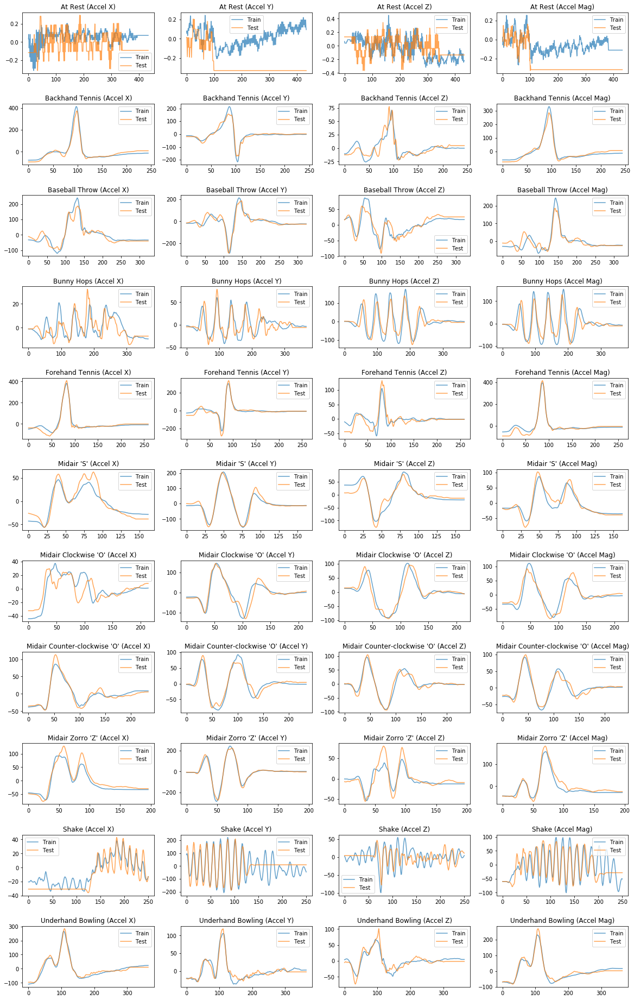

At Rest At Rest 272.2992909924125
Backhand Tennis Backhand Tennis 6312.367102843607
Baseball Throw Baseball Throw 9345.480721786556
Bunny Hops Bunny Hops 7424.219822671021
Forehand Tennis Forehand Tennis 7390.957547773302
Midair 'S' Midair 'S' 3960.2355198999685
Midair Clockwise 'O' Midair Clockwise 'O' 3108.7892931534225
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 2724.353475013136
Midair Zorro 'Z' Midair Zorro 'Z' 3925.497769239166
Shake Shake 18882.65722674499
Underhand Bowling Underhand Bowling 6235.33995576846
Total time elapsed: 140.08
                              precision    recall  f1-score   support

                     At Rest       1.00      1.00      1.00         5
             Backhand Tennis       1.00      1.00      1.00         5
              Baseball Throw       1.00      1.00      1.00         5
                  Bunny Hops       1.00      1.00      1.00         5
             Forehand Tennis       1.00      1.00      1.00         5
                 

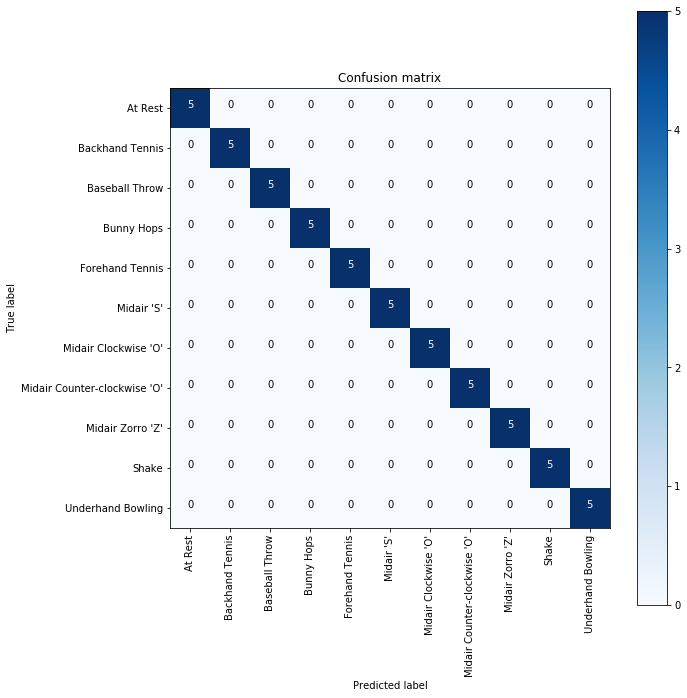

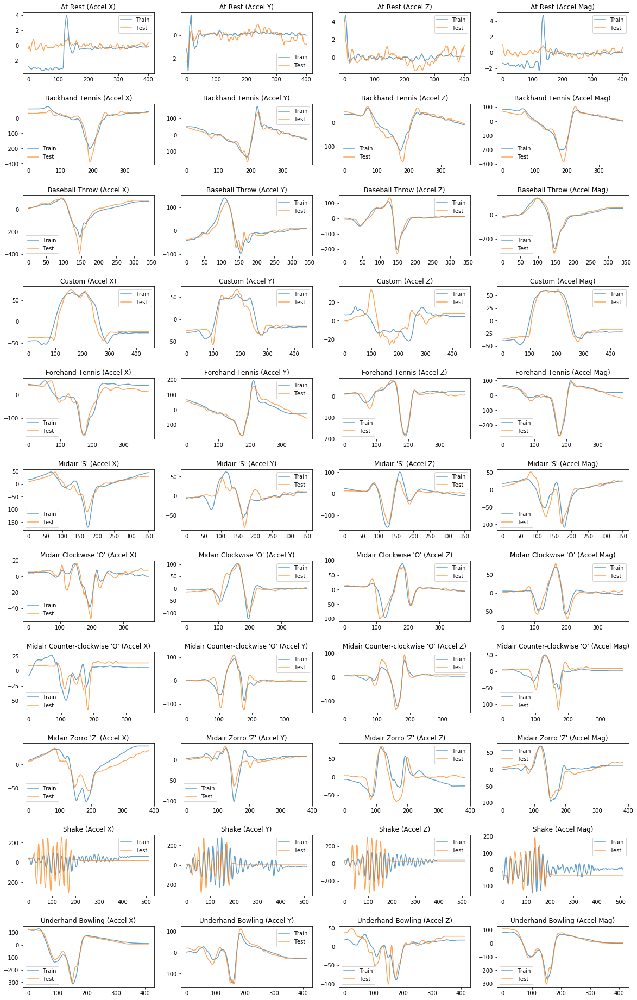

At Rest At Rest 899.7930419546212
Backhand Tennis Backhand Tennis 9474.67100702412
Baseball Throw Baseball Throw 5335.9134224486625
Custom Custom 5068.012552910468
Forehand Tennis Forehand Tennis 9221.489729310524
Midair 'S' Midair 'S' 6851.72595981218
Midair Clockwise 'O' Midair Clockwise 'O' 4423.767168847431
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 9578.473590222122
Midair Zorro 'Z' Midair Zorro 'Z' 9020.185941932312
Shake Shake 78342.74416614996
Underhand Bowling Underhand Bowling 9434.566097524163
Total time elapsed: 198.87
k=1


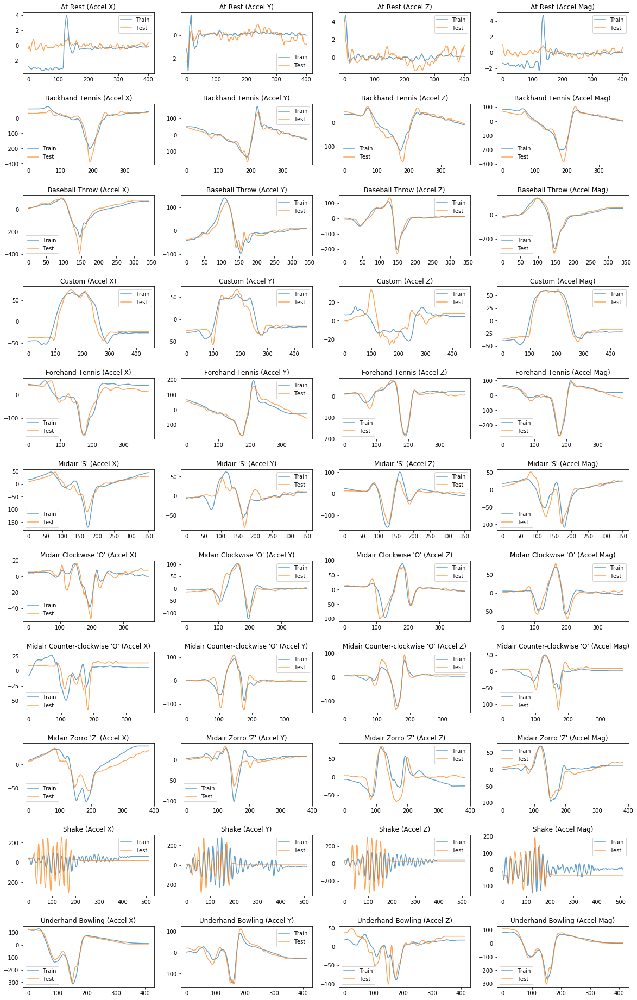

At Rest At Rest 899.7930419546212
Backhand Tennis Backhand Tennis 9474.67100702412
Baseball Throw Baseball Throw 5335.9134224486625
Custom Custom 5068.012552910468
Forehand Tennis Forehand Tennis 9221.489729310524
Midair 'S' Midair 'S' 6851.72595981218
Midair Clockwise 'O' Midair Clockwise 'O' 4423.767168847431
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 9578.473590222122
Midair Zorro 'Z' Midair Zorro 'Z' 9020.185941932312
Shake Shake 78342.74416614996
Underhand Bowling Underhand Bowling 9434.566097524163
Total time elapsed: 198.28
k=2


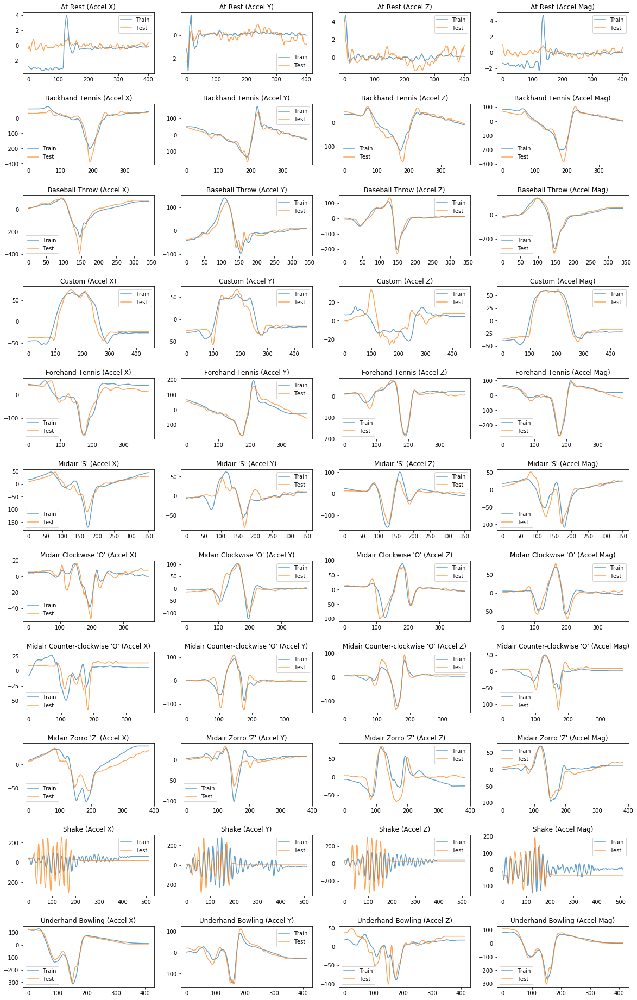

At Rest At Rest 899.7930419546212
Backhand Tennis Backhand Tennis 9474.67100702412
Baseball Throw Baseball Throw 5335.9134224486625
Custom Custom 5068.012552910468
Forehand Tennis Forehand Tennis 9221.489729310524
Midair 'S' Midair 'S' 6851.72595981218
Midair Clockwise 'O' Midair Clockwise 'O' 4423.767168847431
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 9578.473590222122
Midair Zorro 'Z' Midair Zorro 'Z' 9020.185941932312
Shake Shake 78342.74416614996
Underhand Bowling Underhand Bowling 9434.566097524163
Total time elapsed: 195.50
k=3


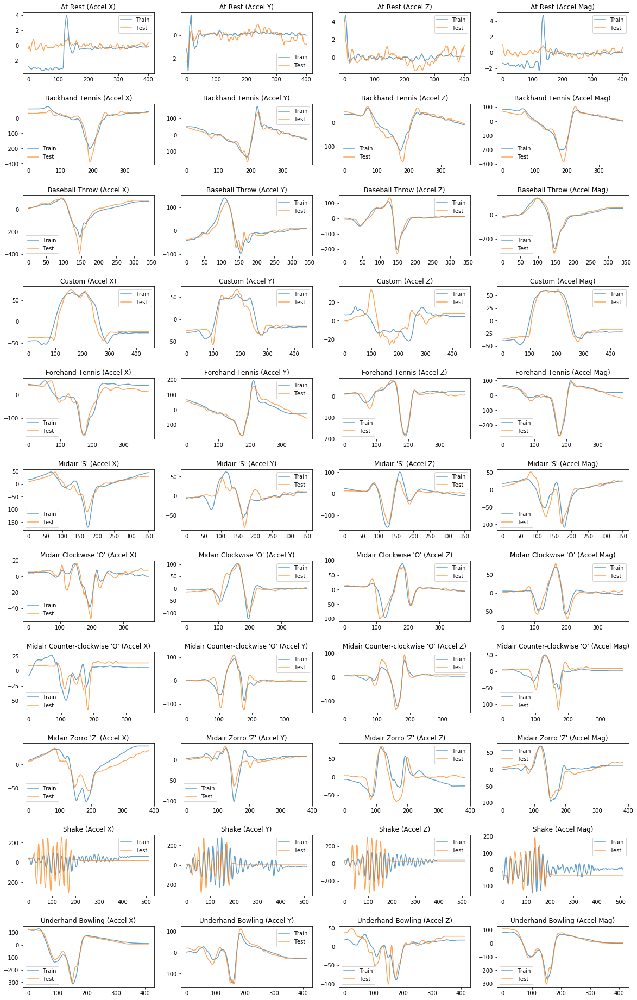

At Rest At Rest 899.7930419546212
Backhand Tennis Backhand Tennis 9474.67100702412
Baseball Throw Baseball Throw 5335.9134224486625
Custom Custom 5068.012552910468
Forehand Tennis Forehand Tennis 9221.489729310524
Midair 'S' Midair 'S' 6851.72595981218
Midair Clockwise 'O' Midair Clockwise 'O' 4423.767168847431
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 9578.473590222122
Midair Zorro 'Z' Midair Zorro 'Z' 9020.185941932312
Shake Shake 78342.74416614996
Underhand Bowling Underhand Bowling 9434.566097524163
Total time elapsed: 194.15
k=4


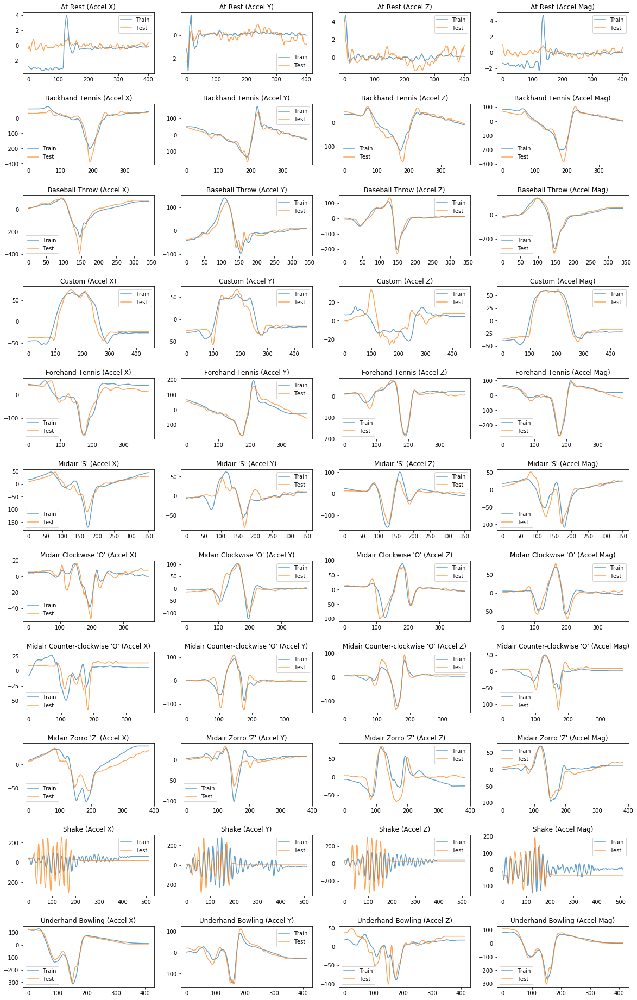

At Rest At Rest 899.7930419546212
Backhand Tennis Backhand Tennis 9474.67100702412
Baseball Throw Baseball Throw 5335.9134224486625
Custom Custom 5068.012552910468
Forehand Tennis Forehand Tennis 9221.489729310524
Midair 'S' Midair 'S' 6851.72595981218
Midair Clockwise 'O' Midair Clockwise 'O' 4423.767168847431
Midair Counter-clockwise 'O' Midair Counter-clockwise 'O' 9578.473590222122
Midair Zorro 'Z' Midair Zorro 'Z' 9020.185941932312
Shake Shake 78342.74416614996
Underhand Bowling Underhand Bowling 9434.566097524163
Total time elapsed: 195.55
                              precision    recall  f1-score   support

                     At Rest       1.00      1.00      1.00         5
             Backhand Tennis       1.00      1.00      1.00         5
              Baseball Throw       1.00      1.00      1.00         5
                      Custom       1.00      1.00      1.00         5
             Forehand Tennis       1.00      1.00      1.00         5
                  Midair 'S

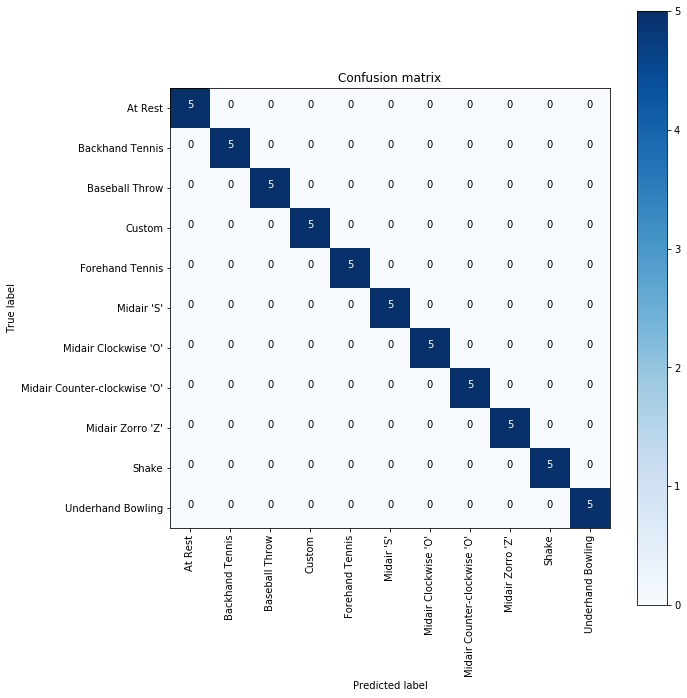

In [68]:
logPath = './GestureLogs/JonGestureLogsEasy'


for g_name in ['Hard', 'Easy', 'CJ']:
    print("=====================")
    print("===========%s=========="%g_name)
    print("=====================")


    selected_gesture_set = get_gesture_set_with_str(g_name)
    numGestures = selected_gesture_set.get_num_gestures()
    numTrialsTotal = selected_gesture_set.get_total_num_of_trials()
    mapGestureToTrials = selected_gesture_set.map_gestures_to_trials
    gestureNamesSorted = selected_gesture_set.get_gesture_names_sorted()

    train, test = split_gestures(selected_gesture_set, mapGestureToTrials, gestureNamesSorted)
    
    y_true=[]
    y_pred=[]
    for i in range(0, 5):
        print('k=%d'%i)
        start = time.time()
        visualize_train_test(train[i], test[i], mapGestureToTrials, gestureNamesSorted)
        y_t, y_p = recognize_gesture(train[i], test[i], gestureNamesSorted)

        y_true.extend(y_t)
        y_pred.extend(y_p)
        end = time.time()
        print("Total time elapsed: %.2f"%(end-start))

    print(classification_report(y_true, y_pred, target_names=gestureNamesSorted))
    plt.figure(figsize=(10,10))
    plot_confusion_matrix(confusion_matrix(y_true, y_pred), classes=gestureNamesSorted)